In [1]:
import os
os.environ["TMPDIR"] = "/mnt/sda/sbachmann/tmp"

In [2]:
%matplotlib inline 

In [3]:
# Imports
import os
import pathlib
import urllib.request

# Site name for Salvus Flow. Uses env var if available, otherwise falls back to local site name.
SALVUS_FLOW_SITE_NAME = os.environ.get("SALVUS_FLOW_SITE_NAME", "salome_remote_2")
PROJECT_DIR = "simulation_wavefield_custom_stf_from_mpm_original_parameters_DENSE" 

# Conservative default to reduce license-seat demand during unstable license-server periods.
RANKS_PER_JOB = 4


def check_license_server_reachable(url="https://l.mondaic.com/licensing_server", timeout=10):
    """Fail fast if licensing endpoint is unreachable to avoid long hanging jobs."""
    try:
        with urllib.request.urlopen(url, timeout=timeout):
            return True
    except Exception as exc:
        raise RuntimeError(
            f"Licensing server not reachable ({url}). Retry later or check network/VPN. Original error: {exc}"
        ) from exc


# # Add code to keep .gitignore updated to ignore salvus files
# gitignore_path = pathlib.Path("..") / ".gitignore"
# with open(gitignore_path, "r+") as f:
#     contents = f.read()
#     if PROJECT_DIR not in contents:
#         f.write(f"\n{PROJECT_DIR}/\n")


import numpy as np
import salvus.namespace as sn
import salvus.flow.simple_config as sc
import xarray as xr
import salvus.namespace as sn
from salvus.project.tools.processing import block_processing
from salvus.toolbox.helpers.wavefield_output import (
    WavefieldOutput,
    wavefield_output_to_xarray,
)
import matplotlib.pyplot as plt
from matplotlib import animation
import obspy

# For wavefield output code
from salvus.mesh.unstructured_mesh_utils import read_model_from_h5
from salvus.toolbox.helpers import wavefield_output
import salvus.flow.api

#for plotting of wiggles, traces 
from scipy import signal

# For animation plot
from IPython.display import HTML
from matplotlib.collections import PolyCollection
import threading
import matplotlib
matplotlib.use("Agg")
from scipy.interpolate import griddata

--> Server: 'https://l.mondaic.com/licensing_server', User: 'salome.bachmann', Group: 'ETHZ_ERDW_EEG'.
--> Negotiating 1 license instance(s) for 'SalvusMesh' [license version 1.0.0] for 1 seconds ...
--> Success! [Total duration: 0.56 seconds]


In [4]:
domain_2d = sn.domain.dim2.BoxDomain(x0=0, x1=240, y0=0, y1=2.25)

p = sn.Project.from_domain(path=PROJECT_DIR, domain=domain_2d, load_if_exists=True)


Accordion()

[2026-07-29 13:46:12,615] INFO: Loading project from simulation_wavefield_custom_stf_from_mpm_original_parameters_DENSE.


Keys in the NPZ file: ['times', 'x_centers', 'y_centers', 'M11', 'M22', 'M12', 'dM11', 'dM12', 'dM22']


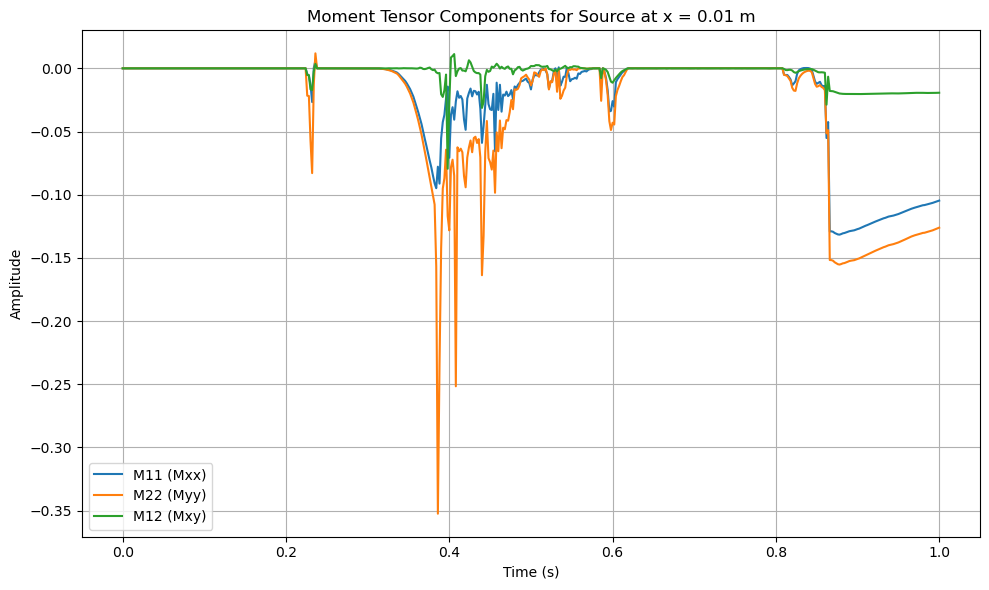

In [5]:
import numpy as np
import matplotlib.pyplot as plt

#Load  .npz archive
data = np.load('test_mpm_mij_B-reference_tau0p3549s.npz')

# Check keys of arrays inside
print("Keys in the NPZ file:", data.files)

# Extract the coordinate and time arrays
times = data['times']
x_centers = data['x_centers']

# Extract Moment Tensor Components and rename them to be the same as slavus 
m11 = np.squeeze(data['M11']) 
m22 = np.squeeze(data['M22']) 
m12 = np.squeeze(data['M12'])


# Plot components of 0th source to check 
source_idx = 0

if m11.shape[0] == len(times):
    y11 = m11[:, source_idx]
    y22 = m22[:, source_idx]
    y12 = m12[:, source_idx]
else:
    y11 = m11[source_idx, :]
    y22 = m22[source_idx, :]
    y12 = m12[source_idx, :]

plt.figure(figsize=(10, 6))
plt.plot(times, y11, label='M11 (Mxx)', linewidth=1.5)
plt.plot(times, y22, label='M22 (Myy)', linewidth=1.5)
plt.plot(times, y12, label='M12 (Mxy)', linewidth=1.5)

plt.title(f'Moment Tensor Components for Source at x = {x_centers[source_idx]:.2f} m')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)
plt.tight_layout()
display(plt.gcf())
plt.close()

Keys in the NPZ file: ['times', 'x_centers', 'y_centers', 'M11', 'M22', 'M12', 'dM11', 'dM12', 'dM22']


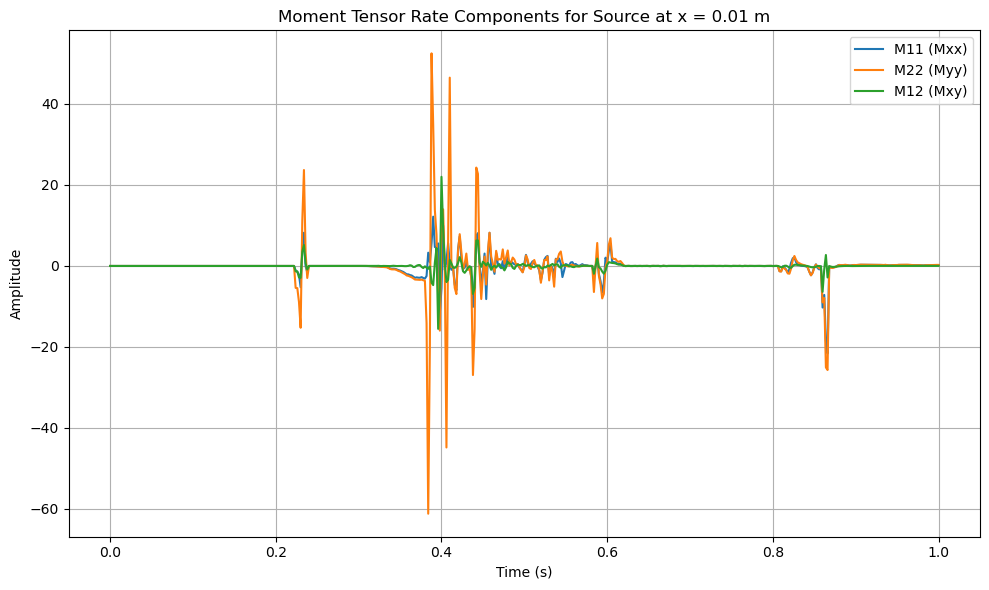

In [6]:
import numpy as np
import matplotlib.pyplot as plt

#Load  .npz archive
data = np.load('test_mpm_mij_B-reference_tau0p3549s.npz')

# Check keys of arrays inside
print("Keys in the NPZ file:", data.files)

# Extract the coordinate and time arrays
times = data['times']
x_centers = data['x_centers']

# Extract Moment Tensor Components and rename them to be the same as slavus 
m11 = np.squeeze(data['dM11']) 
m22 = np.squeeze(data['dM22']) 
m12 = np.squeeze(data['dM12'])


# Plot components of 0th source to check 
source_idx = 0

if m11.shape[0] == len(times):
    y11 = m11[:, source_idx]
    y22 = m22[:, source_idx]
    y12 = m12[:, source_idx]
else:
    y11 = m11[source_idx, :]
    y22 = m22[source_idx, :]
    y12 = m12[source_idx, :]

plt.figure(figsize=(10, 6))
plt.plot(times, y11, label='M11 (Mxx)', linewidth=1.5)
plt.plot(times, y22, label='M22 (Myy)', linewidth=1.5)
plt.plot(times, y12, label='M12 (Mxy)', linewidth=1.5)

plt.title(f'Moment Tensor Rate Components for Source at x = {x_centers[source_idx]:.2f} m')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)
plt.tight_layout()
display(plt.gcf())
plt.close()

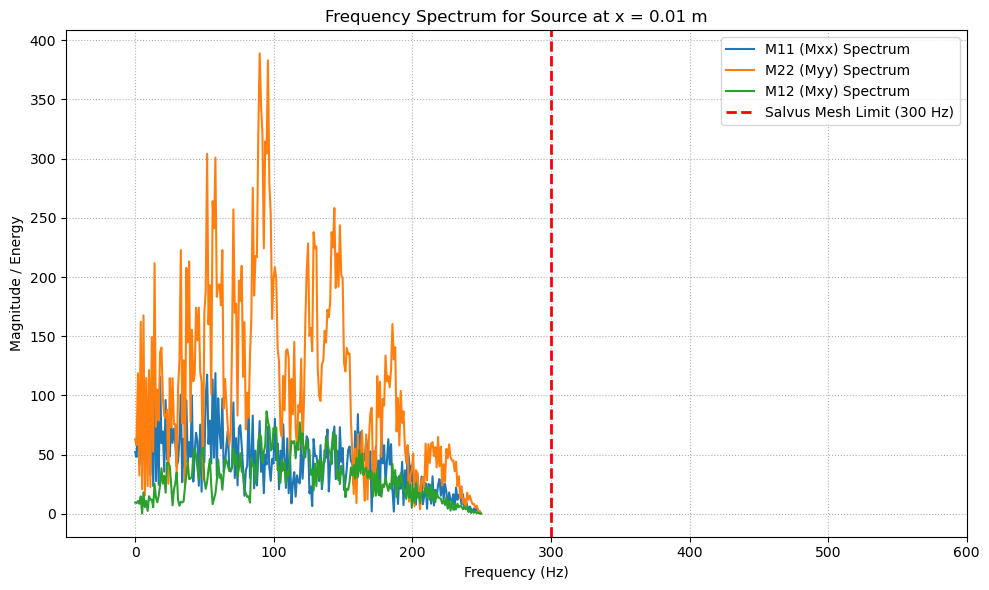

In [7]:
# FFT of source to check specturem
# time-step (dt) and sampling rate (fs) from from times
dt = times[1] - times[0]
fs = 1.0 / dt
N = len(times)

# 2FFT and corresponding frequencies
frequencies = np.fft.rfftfreq(N, d=dt)
fft_y11 = np.abs(np.fft.rfft(y11))
fft_y22 = np.abs(np.fft.rfft(y22))
fft_y12 = np.abs(np.fft.rfft(y12))

plt.figure(figsize=(10, 6))
plt.plot(frequencies, fft_y11, label='M11 (Mxx) Spectrum', linewidth=1.5)
plt.plot(frequencies, fft_y22, label='M22 (Myy) Spectrum', linewidth=1.5)
plt.plot(frequencies, fft_y12, label='M12 (Mxy) Spectrum', linewidth=1.5)


plt.axvline(x=300.0, color='red', linestyle='--', linewidth=2, 
            label='Salvus Mesh Limit (300 Hz)')

plt.title(f'Frequency Spectrum for Source at x = {x_centers[source_idx]:.2f} m')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude / Energy')

plt.xlim(-50, 600) 

plt.legend()
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()
display(plt.gcf())
plt.close()


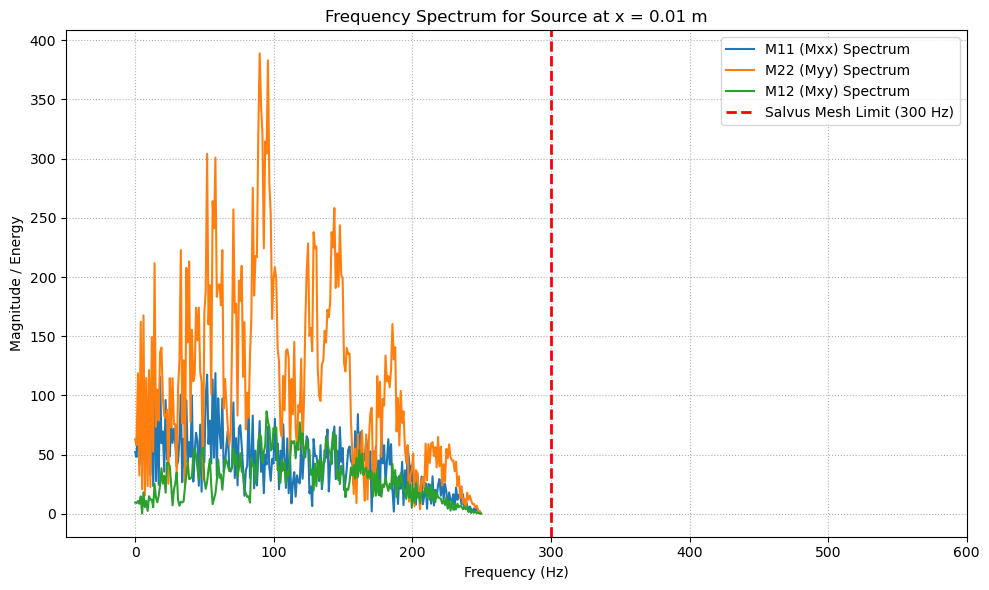

In [8]:
# FFT of source to check specturem
# time-step (dt) and sampling rate (fs) from from times
dt = times[1] - times[0]
fs = 1.0 / dt
N = len(times)

# 2FFT and corresponding frequencies
frequencies = np.fft.rfftfreq(N, d=dt)
fft_y11 = np.abs(np.fft.rfft(y11))
fft_y22 = np.abs(np.fft.rfft(y22))
fft_y12 = np.abs(np.fft.rfft(y12))

plt.figure(figsize=(10, 6))
plt.plot(frequencies, fft_y11, label='M11 (Mxx) Spectrum', linewidth=1.5)
plt.plot(frequencies, fft_y22, label='M22 (Myy) Spectrum', linewidth=1.5)
plt.plot(frequencies, fft_y12, label='M12 (Mxy) Spectrum', linewidth=1.5)


plt.axvline(x=300.0, color='red', linestyle='--', linewidth=2, 
            label='Salvus Mesh Limit (300 Hz)')

plt.title(f'Frequency Spectrum for Source at x = {x_centers[source_idx]:.2f} m')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude / Energy')

plt.xlim(-50, 600) 

plt.legend()
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()
display(plt.gcf())
plt.close()


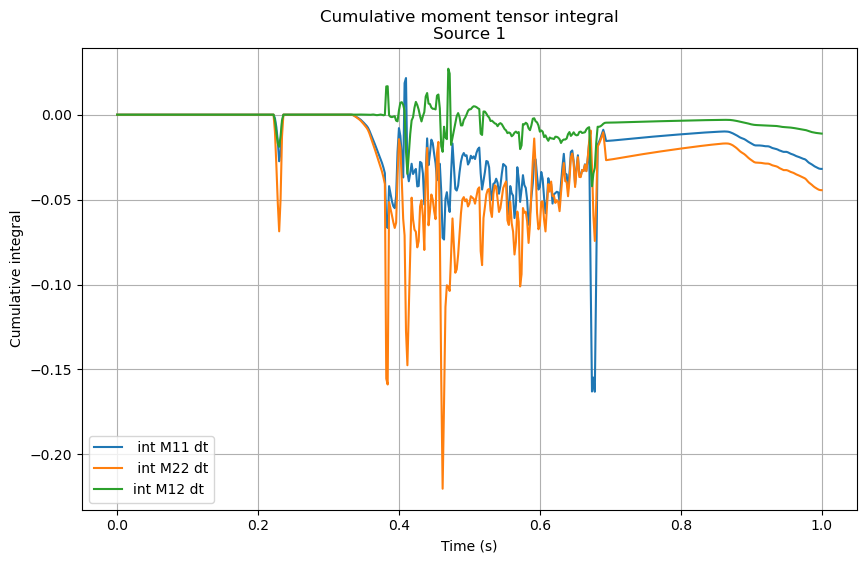

In [9]:
# Plotting cumulative integral of source components over time
# Time step (assumes uniform sampling)
dt = times[1] - times[0]

# Make sure arrays are (nt, nsources)
if m11.shape[0] != len(times):
    m11 = m11.T
    m22 = m22.T
    m12 = m12.T

# SOurce to inspect
source_idx = 1

# Cumulative integrals
I11 = np.cumsum(m11[:, source_idx]) * dt
I22 = np.cumsum(m22[:, source_idx]) * dt
I12 = np.cumsum(m12[:, source_idx]) * dt

plt.figure(figsize=(10,6))
plt.plot(times, I11, label=' int M11 dt')
plt.plot(times, I22, label=' int M22 dt')
plt.plot(times, I12, label='int M12 dt')

plt.xlabel("Time (s)")
plt.ylabel("Cumulative integral")
plt.title(f"Cumulative moment tensor integral\nSource {source_idx}")
plt.grid(True)
plt.legend()
display(plt.gcf())
plt.close()


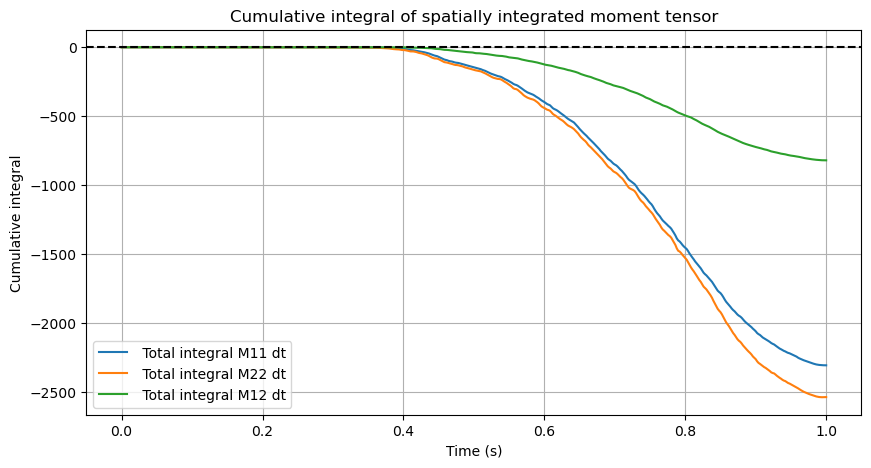

Final cumulative integrals:
M11 : -2.306732e+03
M22 : -2.537217e+03
M12 : -8.201734e+02


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import cumulative_trapezoid

if m11.shape[0] != len(times):
    m11 = m11.T
    m22 = m22.T
    m12 = m12.T


# Spatially integrate (sum over all source points)

M11_total = np.sum(m11, axis=1)
M22_total = np.sum(m22, axis=1)
M12_total = np.sum(m12, axis=1)

# Cumulative time integral over all sources
I11_total = cumulative_trapezoid(M11_total, times, initial=0)
I22_total = cumulative_trapezoid(M22_total, times, initial=0)
I12_total = cumulative_trapezoid(M12_total, times, initial=0)


# Plot total moment histories

plt.figure(figsize=(10,5))

plt.plot(times, M11_total, label='Total M11')
plt.plot(times, M22_total, label='Total M22')
plt.plot(times, M12_total, label='Total M12')

plt.axhline(0, color='k', ls='--')
plt.grid(True)
plt.legend()

plt.xlabel("Time (s)")
plt.ylabel("Spatially summed moment")
plt.title("Spatially integrated moment tensor components")

plt.show()

# Plot cumulaive integrals 
plt.figure(figsize=(10,5))

plt.plot(times, I11_total, label=' Total integral M11 dt')
plt.plot(times, I22_total, label=' Total integral M22 dt')
plt.plot(times, I12_total, label=' Total integral M12 dt')

plt.axhline(0, color='k', ls='--')
plt.grid(True)
plt.legend()

plt.xlabel("Time (s)")
plt.ylabel("Cumulative integral")
plt.title("Cumulative integral of spatially integrated moment tensor")
display(plt.gcf())
plt.close()


print("Final cumulative integrals:")
print(f"M11 : {I11_total[-1]:.6e}")
print(f"M22 : {I22_total[-1]:.6e}")
print(f"M12 : {I12_total[-1]:.6e}")

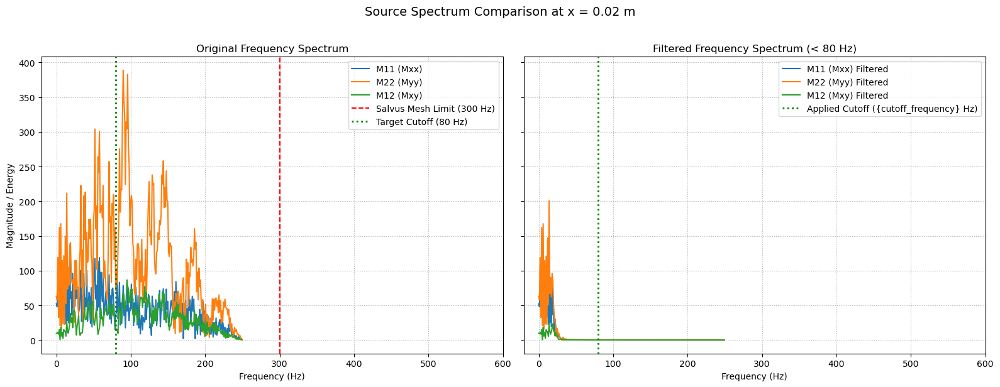

In [11]:

dt = times[1] - times[0]
fs = 1.0 / dt
N = len(times)

# Calculate frequencies
frequencies = np.fft.rfftfreq(N, d=dt)

# Apply low-pass
cutoff_freq = 20.0
nyquist_freq = 0.5 * fs

# Design a 4th-order Butterworth low-pass filter (Normalizing the cutoff frequency by the Nyquist frequency)
b, a = signal.butter(N=4, Wn=cutoff_freq / nyquist_freq, btype='low', analog=False)

# Apply zero-phase filtering to the time-domain signals
y11_filtered = signal.filtfilt(b, a, y11)
y22_filtered = signal.filtfilt(b, a, y22)
y12_filtered = signal.filtfilt(b, a, y12)

# FFT
# Original Spectrum
fft_y11 = np.abs(np.fft.rfft(y11))
fft_y22 = np.abs(np.fft.rfft(y22))
fft_y12 = np.abs(np.fft.rfft(y12))

# Filtered Spectrum
fft_y11_filt = np.abs(np.fft.rfft(y11_filtered))
fft_y22_filt = np.abs(np.fft.rfft(y22_filtered))
fft_y12_filt = np.abs(np.fft.rfft(y12_filtered))


fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Left Plot: Original Unfiltered Spectrum
axes[0].plot(frequencies, fft_y11, label='M11 (Mxx)', linewidth=1.5)
axes[0].plot(frequencies, fft_y22, label='M22 (Myy)', linewidth=1.5)
axes[0].plot(frequencies, fft_y12, label='M12 (Mxy)', linewidth=1.5)
axes[0].axvline(x=300.0, color='red', linestyle='--', linewidth=1.5, label='Salvus Mesh Limit (300 Hz)')
axes[0].axvline(x=80.0, color='green', linestyle=':', linewidth=2, label='Target Cutoff (80 Hz)')
axes[0].set_title('Original Frequency Spectrum')
axes[0].set_xlabel('Frequency (Hz)')
axes[0].set_ylabel('Magnitude / Energy')
axes[0].set_xlim(-20, 600)
axes[0].legend()
axes[0].grid(True, which='both', linestyle=':')

# Right Plot: Filtered Spectrum
axes[1].plot(frequencies, fft_y11_filt, label='M11 (Mxx) Filtered', linewidth=1.5)
axes[1].plot(frequencies, fft_y22_filt, label='M22 (Myy) Filtered', linewidth=1.5)
axes[1].plot(frequencies, fft_y12_filt, label='M12 (Mxy) Filtered', linewidth=1.5)
axes[1].axvline(x=80.0, color='green', linestyle=':', linewidth=2, label='Applied Cutoff ({cutoff_frequency} Hz)')
axes[1].set_title('Filtered Frequency Spectrum (< 80 Hz)')
axes[1].set_xlabel('Frequency (Hz)')
axes[1].set_xlim(-20, 600)
axes[1].legend()
axes[1].grid(True, which='both', linestyle=':')

# Global adjustments
plt.suptitle(f'Source Spectrum Comparison at x = {x_centers[source_idx]:.2f} m', fontsize=14, y=1.02)
plt.tight_layout()
display(plt.gcf())
plt.close()

In [12]:
# print y center of a source to check
y_data = data['y_centers']
print(y_data)

[0.37500001]


In [13]:
from scipy.signal import butter, sosfilt
# Load mpm data
print("Loading raw MPM moment tensor data...")
npz_data = np.load('test_mpm_mij_B-reference_tau0p3549s.npz')

times = npz_data['times']
x_coords = npz_data['x_centers']
y_coords = npz_data['y_centers']

# Calculate the exact native sampling rate of the MPM data
dt = times[1] - times[0]
sampling_rate = 1.0 / dt

print(f"Number of sources: {len(x_coords)}")
print(f"Number of time steps: {len(times)}")
print(f"Native sampling rate: {sampling_rate:.2f} Hz (dt = {dt:.6f} s)")

# Extract the raw moment tensor components and squeeze dummy dimensions
m11_raw = np.squeeze(npz_data['M11'])
m22_raw = np.squeeze(npz_data['M22'])
m12_raw = np.squeeze(npz_data['M12'])

# Ensure axes are aligned to: (Time Steps, Sources)
if m11_raw.shape[0] == len(times):
    m11 = m11_raw
    m22 = m22_raw
    m12 = m12_raw
else:
    m11 = m11_raw.T
    m22 = m22_raw.T
    m12 = m12_raw.T

n_sources = len(x_coords) 

# Dynamically handle y-coordinates if they are a flat scalar or a list
if np.ndim(y_coords) == 0 or len(np.atleast_1d(y_coords)) == 1:
    y_val = float(np.atleast_1d(y_coords)[0])
    y_coords = np.full_like(x_coords, y_val)

# taper_percentage = 0.45  
# N_taper = int(n_sources * taper_percentage)
# N_taper = max(5, min(N_taper, int(n_sources * 0.50)))

# source_taper = np.ones(n_sources)
# source_taper[:N_taper]  = np.hanning(2 * N_taper)[:N_taper]
# source_taper[-N_taper:] = np.hanning(2 * N_taper)[N_taper:]

# # Temporal Butterworth Low-Pass Filter (removes unphysical high-frequency grid noise)
# def lowpass_filter(signal, cutoff=60.0, fs=sampling_rate, order=4):
#     nyq = 0.5 * fs
#     normal_cutoff = cutoff / nyq
#     sos = butter(order, normal_cutoff, btype='low', output='sos')
#     return sosfilt(sos, signal)


# Tail Taper to smoothly fade out active signals at the end of simulation
n_samples = len(times)
time_taper = np.ones(n_samples)
head_taper_len = int(0.15 * n_samples) # 15% fade-in for all sources equally
tail_taper_len = int(0.20 * n_samples) # 20% fade-out for all sources equally

# Hanning windows for the time domain
time_taper[:head_taper_len] = np.hanning(2 * head_taper_len)[:head_taper_len]
time_taper[-tail_taper_len:] = np.hanning(2 * tail_taper_len)[tail_taper_len:]


# Create salvus sources 1:1
srcs = []

for i in range(len(x_coords)):
    # Raw, unchanged time series for this source index
    mxx = m11[:, i] 
    myy = m22[:, i] 
    mxy = m12[:, i]
    # mxx = m11[:, i] * source_taper[i] 
    # myy = m22[:, i] * source_taper[i]
    # mxy = m12[:, i] * source_taper[i]

    # cutoff_freq = 60
    
    # mxx_filt = lowpass_filter(mxx, cutoff=cutoff_freq, fs=sampling_rate)
    # myy_filt = lowpass_filter(myy, cutoff=cutoff_freq, fs=sampling_rate)
    # mxy_filt = lowpass_filter(mxy, cutoff=cutoff_freq, fs=sampling_rate)

    # Apply the tail-taper to eliminate the shutoff shock at t = 1.0s
    mxx_clean = mxx * time_taper
    myy_clean = myy * time_taper
    mxy_clean = mxy * time_taper


    stf_array = np.column_stack((mxx_clean, myy_clean, mxy_clean))
    
    # Buld salvus source
    stf = sc.stf.Custom.from_array(
        array=stf_array,
        sampling_rate_in_hertz=sampling_rate,
        start_time_in_seconds=times[0], 
    )
    


    
    # Build sources with shifted coordinates to avoid boundary issues
    src = sc.source.cartesian.MomentTensorPoint2D(
        x=75 + float(x_coords[i]),
        y=0.150 + float(y_coords[i]),  # Fixed coordinate mapping here
        mxx=1.0,
        myy=1.0,
        mxy=1.0,
        source_time_function=stf,
    )
    srcs.append(src)

print(f"Successfully generated {len(srcs)} sources directly from the MPM file.")

Loading raw MPM moment tensor data...
Number of sources: 4000
Number of time steps: 501
Native sampling rate: 500.00 Hz (dt = 0.002000 s)
Successfully generated 4000 sources directly from the MPM file.


In [14]:
# from scipy.signal import butter, sosfiltfilt

# from scipy.signal import butter, sosfilt
# # Load mpm data
# print("Loading raw MPM moment tensor data...")
# npz_data = np.load('test_mpm_mij_B-reference_tau0p3549s.npz')

# times = npz_data['times']
# x_coords = npz_data['x_centers']
# y_coords = npz_data['y_centers']

# # Calculate the exact native sampling rate of the MPM data
# dt = times[1] - times[0]
# sampling_rate = 1.0 / dt

# print(f"Number of sources: {len(x_coords)}")
# print(f"Number of time steps: {len(times)}")
# print(f"Native sampling rate: {sampling_rate:.2f} Hz (dt = {dt:.6f} s)")

# # Extract the raw moment tensor components and squeeze dummy dimensions
# m11_raw = np.squeeze(npz_data['M11'])
# m22_raw = np.squeeze(npz_data['M22'])
# m12_raw = np.squeeze(npz_data['M12'])

# # Ensure axes are aligned to: (Time Steps, Sources)
# if m11_raw.shape[0] == len(times):
#     m11 = m11_raw
#     m22 = m22_raw
#     m12 = m12_raw
# else:
#     m11 = m11_raw.T
#     m22 = m22_raw.T
#     m12 = m12_raw.T

# n_sources = len(x_coords) 

# # Dynamically handle y-coordinates if they are a flat scalar or a list
# if np.ndim(y_coords) == 0 or len(np.atleast_1d(y_coords)) == 1:
#     y_val = float(np.atleast_1d(y_coords)[0])
#     y_coords = np.full_like(x_coords, y_val)

# taper_percentage = 0.45  
# N_taper = int(n_sources * taper_percentage)
# N_taper = max(5, min(N_taper, int(n_sources * 0.50)))

# source_taper = np.ones(n_sources)
# source_taper[:N_taper]  = np.hanning(2 * N_taper)[:N_taper]
# source_taper[-N_taper:] = np.hanning(2 * N_taper)[N_taper:]

# # # Temporal Butterworth Low-Pass Filter (removes unphysical high-frequency grid noise)
# # def lowpass_filter(signal, cutoff=60.0, fs=sampling_rate, order=4):
# #     nyq = 0.5 * fs
# #     normal_cutoff = cutoff / nyq
# #     sos = butter(order, normal_cutoff, btype='low', output='sos')
# #     return sosfilt(sos, signal)


# # Tail Taper to smoothly fade out active signals at the end of simulation
# n_samples = len(times)
# time_taper = np.ones(n_samples)
# head_taper_len = int(0.15 * n_samples) # 15% fade-in for all sources equally
# tail_taper_len = int(0.20 * n_samples) # 20% fade-out for all sources equally

# # Hanning windows for the time domain
# time_taper[:head_taper_len] = np.hanning(2 * head_taper_len)[:head_taper_len]
# time_taper[-tail_taper_len:] = np.hanning(2 * tail_taper_len)[tail_taper_len:]


# # Using sosfiltfilt instead of sosfilt ensures ZERO phase shift (no artificial time delays)
# def lowpass_filter(signal_array, cutoff=80.0, fs=sampling_rate, order=4):
#     nyq = 0.5 * fs
#     normal_cutoff = cutoff / nyq
#     sos = butter(order, normal_cutoff, btype='low', output='sos')
#     return sosfiltfilt(sos, signal_array)

# # Create salvus sources 1:1
# srcs = []
# cutoff_freq = 20.0  # Set your desired 80 Hz cutoff here

# print(f"Filtering and generating sources with an {cutoff_freq} Hz low-pass filter...")

# for i in range(len(x_coords)):
#     # 1. Extract raw component and apply spatial taper
#     mxx = m11[:, i] * source_taper[i] 
#     myy = m22[:, i] * source_taper[i]
#     mxy = m12[:, i] * source_taper[i]
    
#     # 2. Apply the 80 Hz zero-phase low-pass filter
#     mxx_filt = lowpass_filter(mxx, cutoff=cutoff_freq, fs=sampling_rate)
#     myy_filt = lowpass_filter(myy, cutoff=cutoff_freq, fs=sampling_rate)
#     mxy_filt = lowpass_filter(mxy, cutoff=cutoff_freq, fs=sampling_rate)

#     # 3. Apply the temporal head/tail taper to the filtered data
#     mxx_clean = mxx_filt * time_taper
#     myy_clean = myy_filt * time_taper
#     mxy_clean = mxy_filt * time_taper

#     # Stack components into the STF array
#     stf_array = np.column_stack((mxx_clean, myy_clean, mxy_clean))
    
#     # Build salvus source
#     stf = sc.stf.Custom.from_array(
#         array=stf_array,
#         sampling_rate_in_hertz=sampling_rate,
#         start_time_in_seconds=times[0], 
#     )
    
#     # Build sources with shifted coordinates to avoid boundary issues
#     src = sc.source.cartesian.MomentTensorPoint2D(
#         x=5 + float(x_coords[i]),
#         y=float(y_coords[i]),  
#         mxx=1.0,
#         myy=1.0,
#         mxy=1.0,
#         source_time_function=stf,
#     )
#     srcs.append(src)

# print(f"Successfully generated {len(srcs)} FILTERED sources directly from the MPM file.")

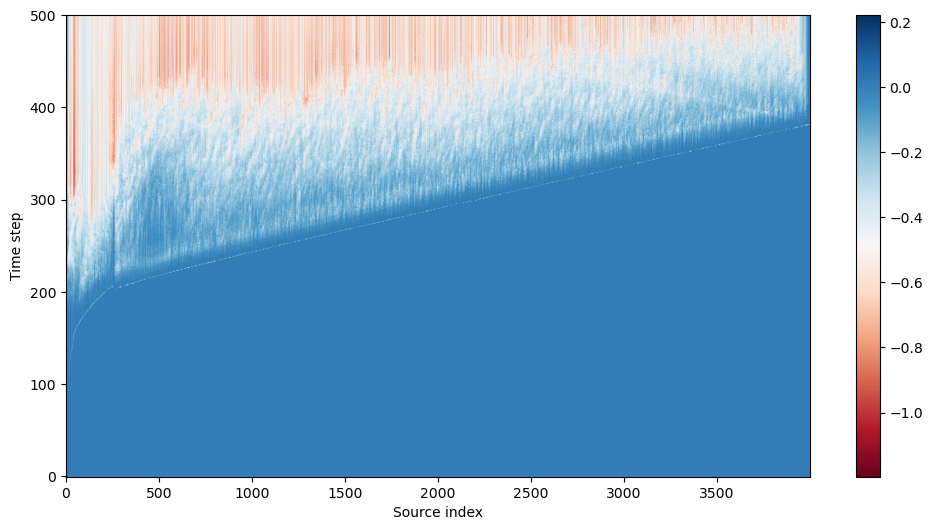

In [15]:
# Plotting one moment tensor component

plt.figure(figsize=(12,6))
plt.imshow(
    m11,
    aspect='auto',
    cmap='RdBu',
    origin='lower'
)
plt.xlabel("Source index")
plt.ylabel("Time step")
plt.colorbar()
display(plt.gcf())
plt.close()

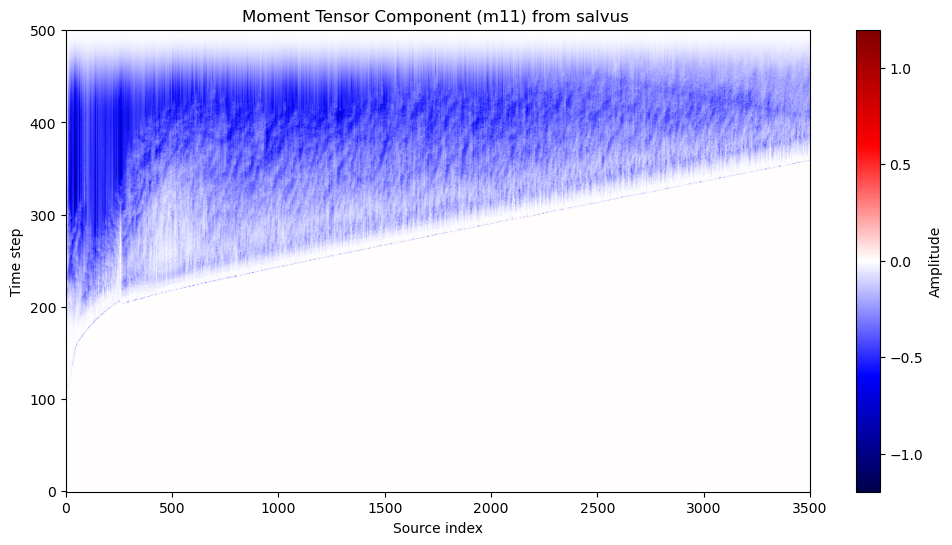

In [16]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

m11_time_series_list = []

for src in srcs:
    h5_path = src.source_time_function.filename
    dataset_name = src.source_time_function.dataset_name
    
    with h5py.File(h5_path, 'r') as f:
        stf_array = np.squeeze(f[dataset_name][:])
        
    m11_component = stf_array[:, 0]
    m11_time_series_list.append(m11_component)

m11_2d_matrix = np.column_stack(m11_time_series_list)

vmax = np.max(np.abs(m11_2d_matrix))

plt.figure(figsize=(12, 6))
im = plt.imshow(
    m11_2d_matrix,
    aspect='auto',
    cmap='seismic',
    origin='lower',
    vmin=-vmax,
    vmax=vmax
)

plt.xlabel("Source index")
plt.ylabel("Time step")
plt.title("Moment Tensor Component (m11) from salvus ")
plt.xlim(0, 3500) 
plt.colorbar(im, label="Amplitude")
display(plt.gcf())
plt.close()

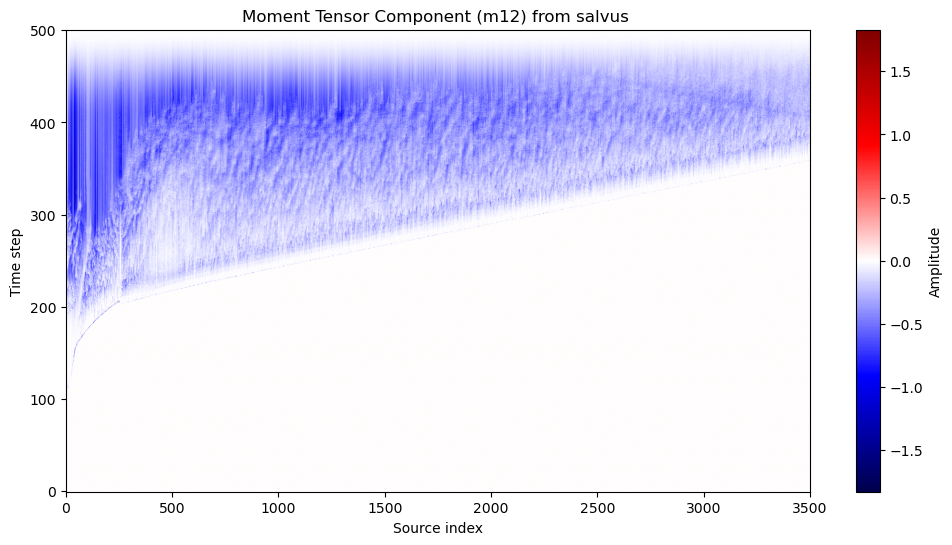

In [17]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

m12_time_series_list = []

for src in srcs:
    h5_path = src.source_time_function.filename
    dataset_name = src.source_time_function.dataset_name
    
    with h5py.File(h5_path, 'r') as f:
        stf_array = np.squeeze(f[dataset_name][:])
        
    m12_component = stf_array[:, 1]
    m12_time_series_list.append(m12_component)

m12_2d_matrix = np.column_stack(m12_time_series_list)

vmax = np.max(np.abs(m12_2d_matrix))

plt.figure(figsize=(12, 6))
im = plt.imshow(
    m12_2d_matrix,
    aspect='auto',
    cmap='seismic',
    origin='lower',
    vmin=-vmax,
    vmax=vmax
)

plt.xlabel("Source index")
plt.ylabel("Time step")
plt.title("Moment Tensor Component (m12) from salvus ")
plt.xlim(0, 3500) 
plt.colorbar(im, label="Amplitude")
display(plt.gcf())
plt.close()

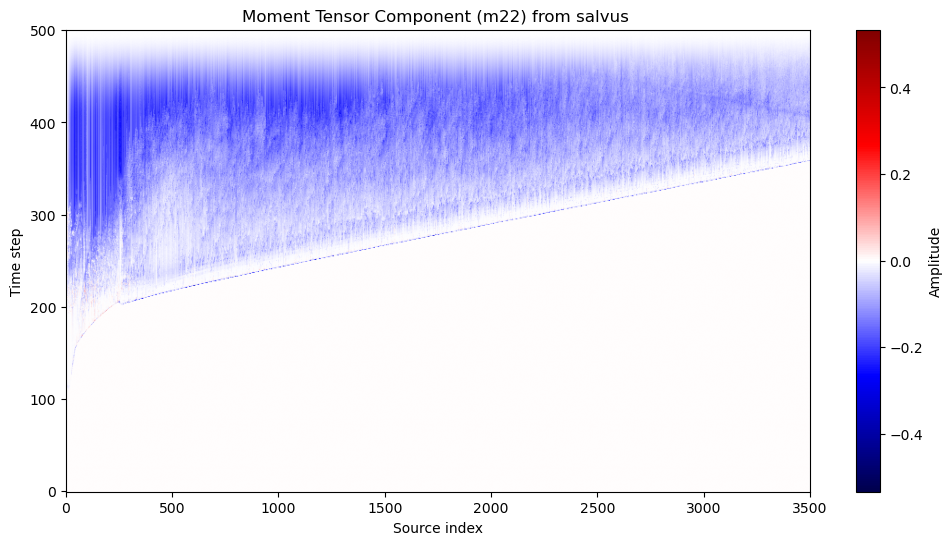

In [18]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

m22_time_series_list = []

for src in srcs:
    h5_path = src.source_time_function.filename
    dataset_name = src.source_time_function.dataset_name
    
    with h5py.File(h5_path, 'r') as f:
        stf_array = np.squeeze(f[dataset_name][:])
        
    m22_component = stf_array[:, 2]
    m22_time_series_list.append(m22_component)

m22_2d_matrix = np.column_stack(m22_time_series_list)

vmax = np.max(np.abs(m22_2d_matrix))

plt.figure(figsize=(12, 6))
im = plt.imshow(
    m22_2d_matrix,
    aspect='auto',
    cmap='seismic',
    origin='lower',
    vmin=-vmax,
    vmax=vmax
)

plt.xlabel("Source index")
plt.ylabel("Time step")
plt.title("Moment Tensor Component (m22) from salvus ")
plt.xlim(0, 3500) 
plt.colorbar(im, label="Amplitude")
display(plt.gcf())
plt.close()

In [19]:
srcs

[{'location': [75.00500066615943, 0.5250000149011612],
  'source_time_function': {'dataset_name': '/stf',
                           'filename': '/tmp/salvus_internal_tmp_sbachmann/salvus.flow_custom_stf__2607291346370047cbe899cf__595046/custom_stf.h5',
                           'wavelet': 'custom'},
  'spatial_type': 'moment_tensor',
  'spatial_weights': [1.0, 1.0, 1.0]},
 {'location': [75.01500061639561, 0.5250000149011612],
  'source_time_function': {'dataset_name': '/stf',
                           'filename': '/tmp/salvus_internal_tmp_sbachmann/salvus.flow_custom_stf__26072913463716978c487de7__595046/custom_stf.h5',
                           'wavelet': 'custom'},
  'spatial_type': 'moment_tensor',
  'spatial_weights': [1.0, 1.0, 1.0]},
 {'location': [75.02500056663179, 0.5250000149011612],
  'source_time_function': {'dataset_name': '/stf',
                           'filename': '/tmp/salvus_internal_tmp_sbachmann/salvus.flow_custom_stf__260729134637268255308446__595046/custom_s

In [20]:
import h5py


h5_path = srcs[0].source_time_function.filename
dataset_name = srcs[0].source_time_function.dataset_name
wavelet_type = srcs[0].source_time_function.wavelet

print(f"Wavelet Type: {wavelet_type}")
print(f"HDF5 File Location: {h5_path}")
print(f"Dataset Name inside HDF5: {dataset_name}\n")

# Open  file to look at the raw custom wavelet data structure
with h5py.File(h5_path, 'r') as f:
    dset = f[dataset_name]
    
    print("--- Dataset Details ---")
    print("Array Shape (n_components, n_samples):", dset.shape)
    print("Data Type:", dset.dtype)
    
    print("\n--- Meta-Data Attributes Attached by Salvus ---")
    for key, val in dset.attrs.items():
        print(f"  {key}: {val}")
        
    # first 10 numerical values of the actual wavelet array
    print("\nFirst 10 amplitude values of the custom array:")
    print(dset[:10])

    

Wavelet Type: custom
HDF5 File Location: /tmp/salvus_internal_tmp_sbachmann/salvus.flow_custom_stf__2607291346370047cbe899cf__595046/custom_stf.h5
Dataset Name inside HDF5: /stf

--- Dataset Details ---
Array Shape (n_components, n_samples): (501, 3)
Data Type: float64

--- Meta-Data Attributes Attached by Salvus ---
  sampling_rate_in_hertz: 500.0
  start_time_in_seconds: 0.0

First 10 amplitude values of the custom array:
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]


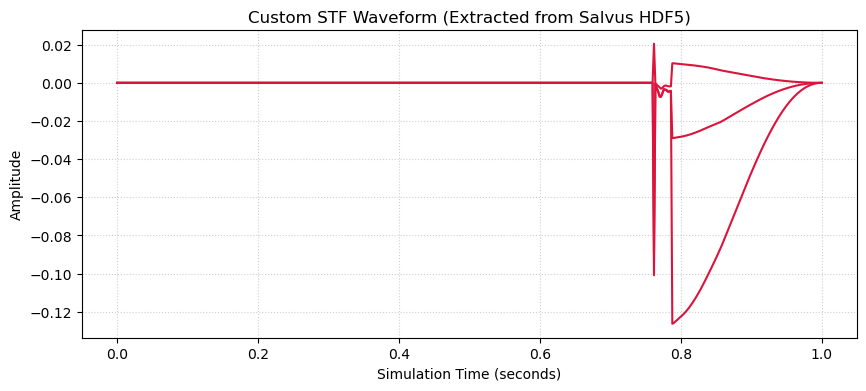

In [21]:


# Path and dataset pointer form object for first source 
h5_path = srcs[3998].source_time_function.filename
dataset_name = srcs[3998].source_time_function.dataset_name

# Extract the array and metadata from the HDF5 file
with h5py.File(h5_path, 'r') as f:
    dset = f[dataset_name]
    stf_array = np.squeeze(dset[:]) # Squeeze removes empty dimensions 
    
    # Extract attributes
    sampling_rate = dset.attrs.get('sampling_rate_in_hertz', 10000.0)
    start_time = dset.attrs.get('start_time_in_seconds', 0.0)

# Time axis of soutce 
dt = 1.0 / sampling_rate
time_axis = start_time + (np.arange(len(stf_array)) * dt)


plt.figure(figsize=(10, 4))
plt.plot(time_axis, stf_array, color='crimson', lw=1.5)
plt.xlabel('Simulation Time (seconds)')
plt.ylabel('Amplitude')
plt.title('Custom STF Waveform (Extracted from Salvus HDF5)')
plt.grid(True, linestyle=':', alpha=0.6)
display(plt.gcf())
plt.close()

In [22]:
# import numpy as np
# import matplotlib.pyplot as plt

# #Load  .npz archive
# data = np.load('test_mpm_mij_B-reference_tau0p3549s.npz')

# # Check keys of arrays inside

# source_idx = 1



# # Extract the coordinate and time arrays
# times = data['times']
# x_centers = data['x_centers']

# # Extract Moment Tensor Components and rename them to be the same as slavus 
# m11 = np.squeeze(data['dM11']) 
# m22 = np.squeeze(data['dM22']) 
# m12 = np.squeeze(data['dM12'])


# # Plot components of 0th source to check 


# if m11.shape[0] == len(times):
#     y11 = m11[:, source_idx]
#     y22 = m22[:, source_idx]
#     y12 = m12[:, source_idx]
# else:
#     y11 = m11[source_idx, :]
#     y22 = m22[source_idx, :]
#     y12 = m12[source_idx, :]

# plt.figure(figsize=(10, 6))
# plt.plot(times, y11, label='M11 (Mxx)', linewidth=1.5)
# plt.plot(times, y22, label='M22 (Myy)', linewidth=1.5)
# plt.plot(times, y12, label='M12 (Mxy)', linewidth=1.5)

# plt.title(f'Moment Tensor Rate Components for Source at x = {x_centers[source_idx]:.2f} m')
# plt.xlabel('Time (s)')
# plt.ylabel('Amplitude')
# plt.legend()
# plt.grid(True)
# plt.tight_layout()
# display(plt.gcf())
# plt.close()




# # Path and dataset pointer form object for first source 
# h5_path = srcs[source_idx].source_time_function.filename
# dataset_name = srcs[source_idx].source_time_function.dataset_name

# # Extract the array and metadata from the HDF5 file
# with h5py.File(h5_path, 'r') as f:
#     dset = f[dataset_name]
#     stf_array = np.squeeze(dset[:]) # Squeeze removes empty dimensions 
    
#     # Extract attributes
#     sampling_rate = dset.attrs.get('sampling_rate_in_hertz', 10000.0)
#     start_time = dset.attrs.get('start_time_in_seconds', 0.0)

# # Time axis of soutce 
# dt = 1.0 / sampling_rate
# time_axis = start_time + (np.arange(len(stf_array)) * dt)


# plt.figure(figsize=(10, 4))
# plt.plot(time_axis, stf_array, color='crimson', lw=1.5)
# plt.xlabel('Simulation Time (seconds)')
# plt.ylabel('Amplitude')
# plt.title('Custom STF Waveform (Extracted from Salvus HDF5)')
# plt.grid(True, linestyle=':', alpha=0.6)
# display(plt.gcf())
# plt.close()



# import numpy as np
# import matplotlib.pyplot as plt

# #Load  .npz archive
# data = np.load('test_mpm_mij_B-reference_tau0p3549s.npz')

# # Check keys of arrays inside
# print("Keys in the NPZ file:", data.files)

# # Extract the coordinate and time arrays
# times = data['times']
# x_centers = data['x_centers']

# # Extract Moment Tensor Components and rename them to be the same as slavus 
# m11 = np.squeeze(data['M11']) 
# m22 = np.squeeze(data['M22']) 
# m12 = np.squeeze(data['M12'])


# # Plot components of 0th source to check 


# if m11.shape[0] == len(times):
#     y11 = m11[:, source_idx]
#     y22 = m22[:, source_idx]
#     y12 = m12[:, source_idx]
# else:
#     y11 = m11[source_idx, :]
#     y22 = m22[source_idx, :]
#     y12 = m12[source_idx, :]

# plt.figure(figsize=(10, 6))
# plt.plot(times, y11, label='M11 (Mxx)', linewidth=1.5)
# plt.plot(times, y22, label='M22 (Myy)', linewidth=1.5)
# plt.plot(times, y12, label='M12 (Mxy)', linewidth=1.5)

# plt.title(f'Moment Tensor Components for Source at x = {x_centers[source_idx]:.2f} m')
# plt.xlabel('Time (s)')
# plt.ylabel('Amplitude')
# plt.legend()
# plt.grid(True)
# plt.tight_layout()
# display(plt.gcf())
# plt.close()


In [23]:
NU = 0.3

# Density (kg/m^3)
RHO_SLAB = 250.0
RHO_BED  = 300.0
RHO_WL   = 100.0

def calc_vp_vs(E, rho, nu=0.3):
    """Converts Young's Modulus and Density to Vp and Vs."""
    M = E * (1 - nu) / ((1 + nu) * (1 - 2 * nu))  # P-wave modulus
    G = E / (2 * (1 + nu))                        # Shear modulus
    vp = np.sqrt(M / rho)
    vs = np.sqrt(G / rho)
    return vp, vs

# Young's Modulus (Pa)
vp_slab, vs_slab = calc_vp_vs(3e6, RHO_SLAB, NU)
vp_bed,  vs_bed  = calc_vp_vs(4e6, RHO_BED, NU)
vp_wl,   vs_wl   = calc_vp_vs(1e6, RHO_WL, NU)

print(f"Slab: Vp = {vp_slab:.2f} m/s, Vs = {vs_slab:.2f} m/s")
print(f"Bed:  Vp = {vp_bed:.2f} m/s, Vs = {vs_bed:.2f} m/s")
print(f"WL:   Vp = {vp_wl:.2f} m/s, Vs = {vs_wl:.2f} m/s")


# Geometry definition
HEIGHT_BED          = 0.3
HEIGHT_SLAB_BOTTOM  = 0.15
HEIGHT_WL           = 0.15
HEIGHT_SLAB_TOP       = 0.15
HEIGHT_AIR_PHYSICAL = 0.3
HEIGHT_BUFFER       = 1.2 # Top buffer space to absorb the ABC sponge

# Total height allocated to the air material zone
TOTAL_AIR_HEIGHT = HEIGHT_AIR_PHYSICAL + HEIGHT_BUFFER

# Calculate precise absolute y-coordinates for Salvus interfaces
y_bed_slab = HEIGHT_BED
y_slab_wl  = y_bed_slab + HEIGHT_SLAB_BOTTOM
y_wl_slab  = y_slab_wl + HEIGHT_WL              # 0.45 m
y_slab_air = y_wl_slab + HEIGHT_SLAB_TOP            # 0.75 m
DOMAIN_HEIGHT = y_slab_air + TOTAL_AIR_HEIGHT  # 0.75 + 1.50 = 2.25 m


# Define Materials
bed_mat  = sn.material.from_params(rho=RHO_BED,  vp=vp_bed,  vs=vs_bed)
wl_mat   = sn.material.from_params(rho=RHO_WL,   vp=vp_wl,   vs=vs_wl)
slab_mat = sn.material.from_params(rho=RHO_SLAB, vp=vp_slab, vs=vs_slab)
air_mat  = sn.material.from_params(rho=1.225,    vp=300.0)

# Build Interfaces (at absolute y-coordinates)
interface_slab_air = sn.layered_meshing.interface.Hyperplane.at(y_slab_air) # y = 0.75 m
interface_wl_slab  = sn.layered_meshing.interface.Hyperplane.at(y_wl_slab)  # y = 0.45 m
interface_slab_wl  = sn.layered_meshing.interface.Hyperplane.at(y_slab_wl)
interface_bed_slab = sn.layered_meshing.interface.Hyperplane.at(y_bed_slab)   # y = 0.30 m

# Assemble LayeredModel (Strictly sorted from TOP to BOTTOM)
model_layers = sn.layered_meshing.LayeredModel([
    air_mat,
    interface_slab_air,
    slab_mat, 
    interface_wl_slab,
    wl_mat,
    interface_slab_wl,
    slab_mat,
    interface_bed_slab, 
    bed_mat

])



# Generate Domain Space Boundary
domain_2d = sn.domain.dim2.BoxDomain(
    x0=0.0, x1=240.0,
    y0=0.0, y1=DOMAIN_HEIGHT
)

# Generate salvus mesh 
max_frequency = 250.0

mesh_4layer = sn.layered_meshing.mesh_from_domain(
    domain=domain_2d,
    model=model_layers,
    mesh_resolution=sn.MeshResolution(reference_frequency=max_frequency, elements_per_wavelength = 4.5),
   

)

print(f"\nMesh created! Total domain height: {DOMAIN_HEIGHT:.2f} m")
print(f"Top active absorbing boundary (ABC) zone: y = 1.25 m to y = 2.25 m")
print(f"Sources at center of WL will fire cleanly at: y = 0.525 m")

Slab: Vp = 127.10 m/s, Vs = 67.94 m/s
Bed:  Vp = 133.97 m/s, Vs = 71.61 m/s
WL:   Vp = 116.02 m/s, Vs = 62.02 m/s



Mesh created! Total domain height: 2.25 m
Top active absorbing boundary (ABC) zone: y = 1.25 m to y = 2.25 m
Sources at center of WL will fire cleanly at: y = 0.525 m


In [24]:
mesh_4layer

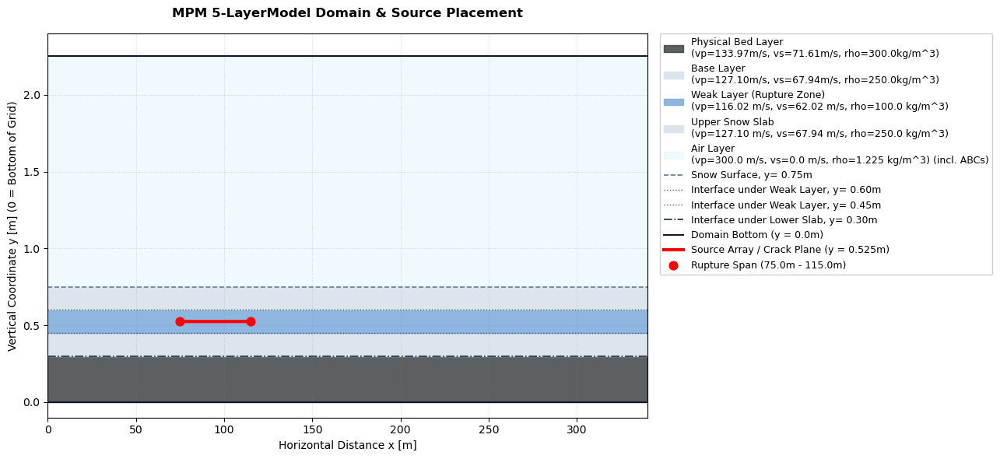

In [25]:
if 'x_coords' in globals() and 'y_coords' in globals():
    x_buffer = 75.0
    x_data = x_coords + x_buffer
    # Shift source coordinate by +0.15m so it sits inside the weak layer (y = 0.525m)
    y_src = float(np.atleast_1d(y_coords)[0]) + 0.15
else:
    # Safe fallback values if running this cell in isolation
    x_data = np.linspace(5.0, 45.0, 100)
    y_src = 0.525

# Define your absolute y-coordinates building from y=0 up to the top
y_bottom       = 0.0   # Bottom of domain / Base of physical bed layer
y_bed_slab     = 0.3   # Bed / Lower Slab interface
y_slab_wl      = 0.45  # Lower Slab / Weak Layer interface
y_wl_slab      = 0.60  # Weak Layer / Upper Slab interface
y_slab_air     = 0.75  # Snow Surface / Air interface (Receiver Depth)
y_air_buffer   = 1.05  # Top of physical Air layer / Start of Top Buffer
y_top          = 2.25  # Top of the domain (Total height)

# The 1.0m thick ABC sponge is at y1 (top), extending down from the ceiling
y_abc_bottom   = y_top - 1.0  # 2.25 - 1.0 = 1.25m

# Plot
plt.figure(figsize=(13, 6))

# Color Palette (Ensuring both slab layers share the exact same color)
colors = {
    'bed':    "#34383c", # Darker Gray
    'wl':     "#81afdd", # Muted Slate Blue
    'slab':   '#d9e2ec', # Light Gray-Blue (used for both Lower and Upper Slab)
    'air':    '#e1f5fe', # Light Sky Blue
    'buffer': '##e1f5fe'  # Top Buffer Gray
}

# Plot the physical layers as horizontal spans from bottom to top
plt.axhspan(y_bottom, y_bed_slab, color=colors['bed'], alpha=0.8, 
            label='Physical Bed Layer\n(vp=133.97m/s, vs=71.61m/s, rho=300.0kg/m^3)')

plt.axhspan(y_bed_slab, y_slab_wl, color=colors['slab'], alpha=0.9, 
            label='Base Layer\n(vp=127.10m/s, vs=67.94m/s, rho=250.0kg/m^3)')

plt.axhspan(y_slab_wl, y_wl_slab, color=colors['wl'], alpha=0.9, 
            label='Weak Layer (Rupture Zone)\n(vp=116.02 m/s, vs=62.02 m/s, rho=100.0 kg/m^3)')

plt.axhspan(y_wl_slab, y_slab_air, color=colors['slab'], alpha=0.9, 
            label='Upper Snow Slab\n(vp=127.10 m/s, vs=67.94 m/s, rho=250.0 kg/m^3)')

plt.axhspan(y_slab_air, y_top, color=colors['air'], alpha=0.5, 
            label='Air Layer\n(vp=300.0 m/s, vs=0.0 m/s, rho=1.225 kg/m^3) (incl. ABCs)')

# plt.axhspan(y_air_buffer, y_top, color=colors['buffer'], alpha=0.7, 
#             label='Top Air Buffer Layer\n(Extends from y=1.05 to y=2.25)')

# # Highlight the active ABC sponge zone at the top of the domain
# plt.axhspan(y_abc_bottom, y_top, edgecolor='none', facecolor='red', alpha=0.08, hatch='//',
#             label='Active Absorbing Boundary (ABC)\n(Damps upward waves from y=1.25 to y=2.25)')

# 3. Draw Boundary Interfaces
plt.axhline(y_top,        color='#0f172a', linestyle='-',  linewidth=1.5)
#plt.axhline(y_air_buffer, color='#475569', linestyle=':',  linewidth=1.0, label=f'Top of Physical Air (y = {y_air_buffer}m)')
plt.axhline(y_slab_air,   color='#627d98', linestyle='--', linewidth=1.2, label=f'Snow Surface, y= {y_slab_air:.2f}m')
plt.axhline(y_wl_slab,    color='#475569', linestyle=':',  linewidth=1.0, label=f'Interface under Weak Layer, y= {y_wl_slab:.2f}m')
plt.axhline(y_slab_wl,    color='#475569', linestyle=':',  linewidth=1.0, label=f'Interface under Weak Layer, y= {y_slab_wl:.2f}m')
plt.axhline(y_bed_slab,   color='#102a43', linestyle='-.', linewidth=1.2, label=f'Interface under Lower Slab, y= {y_bed_slab:.2f}m')
plt.axhline(y_bottom,     color='#0f172a', linestyle='-',  linewidth=1.5, label='Domain Bottom (y = 0.0m)')

# 4. Plot the Source Array (Now at y = 0.525m inside the Weak Layer)
plt.plot(x_data, [y_src] * len(x_data), color='red', linestyle='-', linewidth=3.0, 
         label=f'Source Array / Crack Plane (y = {y_src:.3f}m)')

# Explicitly mark the start and end point sources
plt.scatter([x_data[0], x_data[-1]], [y_src, y_src], color='red', zorder=5, s=60, 
            label=f'Rupture Span ({x_data[0]:.1f}m - {x_data[-1]:.1f}m)')

# 5. Layout & Formatting
plt.title("MPM 5-LayerModel Domain & Source Placement", fontsize=12, fontweight='bold', pad=15)
plt.xlabel("Horizontal Distance x [m]", fontsize=10)
plt.ylabel("Vertical Coordinate y [m] (0 = Bottom of Grid)", fontsize=10)

plt.xlim(0.0, 340.0)
plt.ylim(-0.1, 2.4)  
plt.grid(True, linestyle=':', alpha=0.3, color='gray')

# Setup Legend
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', framealpha=0.95, fontsize=9, borderaxespad=0)

plt.tight_layout()
plt.show()
display(plt.gcf())
plt.close()

In [26]:
# Initialize simulation object, pass multiple sources
sim = sc.simulation.Waveform(mesh=mesh_4layer, sources=srcs)

# physics parameters 
sim.physics.wave_equation.end_time_in_seconds = 6.545
sim.physics.wave_equation.start_time_in_seconds = -0.2

abc_sides = sc.boundary.Absorbing(
    width_in_meters=float(x_buffer), 
    side_sets=["x0", "x1"],
    taper_amplitude=300.0 * 2.0,
    side_sets_are_axis_aligned=True
)

abc_bottom = sc.boundary.Absorbing(
    width_in_meters=1.0, 
    side_sets=["y1"],
    taper_amplitude=300.0 * 2.0,
    side_sets_are_axis_aligned=True
)

sim.physics.wave_equation.boundaries = [abc_sides, abc_bottom]

sim.output.volume_data.format = "hdf5"
sim.output.volume_data.fields = ["displacement", "velocity"]
sim.output.volume_data.filename = "volume_data_output.h5"
sim.output.volume_data.sampling_interval_in_time_steps = 75


moving_source_output_folder = str(pathlib.Path(PROJECT_DIR) / "custom_job_moving_source_all_sources")

print(f"Launching simulation. Outputs will be copied to: {moving_source_output_folder}")


Launching simulation. Outputs will be copied to: simulation_wavefield_custom_stf_from_mpm_original_parameters_DENSE/custom_job_moving_source_all_sources


In [ ]:

# Launchg
salvus.flow.api.run(
    input_file=sim,
    site_name=SALVUS_FLOW_SITE_NAME,
    ranks=RANKS_PER_JOB,
    output_folder=moving_source_output_folder,
    overwrite=True,
    get_all=True, 
)

print("Run finished successfully!")

/home/sbachmann/miniforge3/envs/salvus/lib/python3.11/site-packages/salvus/flow/executors/__init__.py:172: SalvusFlowWarning: Configuration for site 'salome_remote_2' changed since it was last initialized. Please initialize it again.
  value = all_available_executors[site["site_type"]](


SalvusJob `job_2607250941384131_98aeb1a45f` running on `salome_remote_2` with 4 rank(s).
Site information:
  * Salvus version: 2025.1.2
  * Floating point size: 32


Solving forward problem/Computing forward wavefield:   0%|          | 0/385740 [00:00<?, ?it/s]

* Downloaded 199.5 GB of results to `simulation_wavefield_custom_stf_from_mpm_original_parameters_DENSE/custom_job_moving_source_all_sources`.
* Total run time: 14695.30 seconds.
* Pure simulation time: 11284.52 seconds.
Run finished successfully!


In [27]:
vol_file = pathlib.Path("/mnt/sda/salome/heavy-workspace/salvus_data/tmp_directory/job_2607272217225450_b65c14f2ae/volume_data_output.h5")
if not vol_file.exists():
    raise RuntimeError(
        f"Missing output file: {vol_file}. Re-run the launch cell and verify the job completed."
    )

vel_wo = wavefield_output.WavefieldOutput.from_file(
    vol_file,
    "velocity",
    "volume",
)

vel_2d_layered = wavefield_output.wavefield_output_to_xarray(
    vel_wo,
    points=[np.linspace(0, 240, 500), np.linspace(0, 2.25, 101)],
)

print(f"Loaded velocity from {vol_file}")
print(f"Shape: {vel_2d_layered.dims}")
print(vel_2d_layered)

Finding enclosing elements (pass 1 of auto):   0%|          | 0/50500 [00:00<?, ?it/s]

Finding enclosing elements (pass 2 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 3 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 4 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 5 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 6 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

[2026-07-28 09:28:17,882] WARNING - salvus.mesh.algorithms.unstructured_mesh.utils: 33500 points were not claimed by enclosing elements. Depending on your use case, this may not be an issue.


Extracting wavefield to regular grid:   0%|          | 0/2 [00:00<?, ?it/s]

Loaded velocity from /mnt/sda/salome/heavy-workspace/salvus_data/tmp_directory/job_2607272217225450_b65c14f2ae/volume_data_output.h5
Shape: ('t', 'c', 'x', 'y')
<xarray.DataArray (t: 5863, c: 2, x: 500, y: 101)> Size: 2GB
array([[[[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         ...,
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan]],

        [[ 0.0000000e+00,  0.0

In [ ]:
vol_file = pathlib.Path(moving_source_output_folder) / "volume_data_output.h5"
if not vol_file.exists():
    raise RuntimeError(
        f"Missing output file: {vol_file}. Re-run the launch cell and verify the job completed."
    )

vel_wo = wavefield_output.WavefieldOutput.from_file(
    vol_file,
    "velocity",
    "volume",
)

vel_2d_layered = wavefield_output.wavefield_output_to_xarray(
    vel_wo,
    points=[np.linspace(0, 240, 1601), np.linspace(0, 2.25, 101)],
)

print(f"Loaded velocity from {vol_file}")
print(f"Shape: {vel_2d_layered.dims}")
print(vel_2d_layered)

Using dimensions: {'x': 'x', 'y': 'y', 't': 't', 'c': 'c', 'event': None}
t range: -0.2 -> 6.545583036859777
vx shape: (5863, 500)
vy shape: (5863, 500)


/tmp/ipykernel_399770/3444558834.py:56: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vx = axes[0].pcolormesh(
/tmp/ipykernel_399770/3444558834.py:78: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vy = axes[1].pcolormesh(


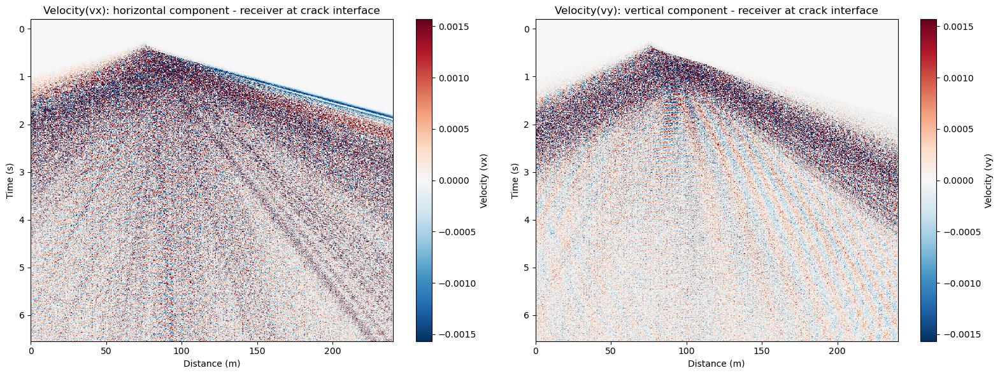

In [28]:
# Force inline display in case backend was set to Agg earlier
import matplotlib.pyplot as plt
from IPython.display import display

# Define receiver line 
y_surface = 0.45 # 

# dis_2d_layered is already an xarray built from all events.
# Use direct selection instead of calling wavefield_output_to_xarray again.
    
# Resolve coordinate / dimension names robustly.
coords_set = set(vel_2d_layered.coords)
dims_set = set(vel_2d_layered.dims)

x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

if x_name is None or y_name is None or t_name is None or c_name is None:
    raise ValueError(f"Could not resolve required dimensions. Found dims={vel_2d_layered.dims}, coords={list(vel_2d_layered.coords)}")

# Select both components at y receiver line
sg_vx = vel_2d_layered.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
sg_vy = vel_2d_layered.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# Keep all moving-source events by reducing event dimension to a single stacked section.
if e_name is not None and e_name in sg_vx.dims:
    sg_vx_plot = sg_vx.mean(dim=e_name)
    sg_vy_plot = sg_vy.mean(dim=e_name)
else:
    sg_vx_plot = sg_vx
    sg_vy_plot = sg_vy

# Ensure plotting order is (time, x)
sg_vx_plot = sg_vx_plot.transpose(t_name, x_name)
sg_vy_plot = sg_vy_plot.transpose(t_name, x_name)

t_vals = sg_vx_plot[t_name].values
x_line = sg_vx_plot[x_name].values
data_vx = sg_vx_plot.values
data_vy = sg_vy_plot.values

print("Using dimensions:", {"x": x_name, "y": y_name, "t": t_name, "c": c_name, "event": e_name})
print("t range:", t_vals[0], "->", t_vals[-1])
print("vx shape:", data_vx.shape)
print("vy shape:", data_vy.shape)

# Clip colorscale (use same scale for both for comparison)
vmax = np.percentile(np.abs([data_vx, data_vy]), 95)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot vx (horizontal component)
im_vx = axes[0].pcolormesh(
    x_line,
    t_vals,
    data_vx,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[0].invert_yaxis()

# Mark all moving source positions
# for x_src in x_positions:
#     axes[0].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_xlim(0, 240)
axes[0].set_title("Velocity(vx): horizontal component - receiver at crack interface")
plt.colorbar(im_vx, ax=axes[0], label="Velocity (vx)")

# Plot vy (vertical component)
im_vy = axes[1].pcolormesh(
    x_line,
    t_vals,
    data_vy,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[1].invert_yaxis()

# # Mark all moving source positions
# for x_src in x_positions:
#     axes[1].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_xlim(0, 240)
axes[1].set_title("Velocity(vy): vertical component - receiver at crack interface")
plt.colorbar(im_vy, ax=axes[1], label="Velocity (vy)")

plt.tight_layout()

# Display explicitly in notebook output
display(fig)
plt.close(fig)

Using dimensions: {'x': 'x', 'y': 'y', 't': 't', 'c': 'c', 'event': None}
t range: -0.2 -> 6.545174858713123
vx shape: (7716, 1601)
vy shape: (7716, 1601)


/tmp/ipykernel_287796/1306594242.py:59: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vx = axes[0].pcolormesh(
/tmp/ipykernel_287796/1306594242.py:81: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vy = axes[1].pcolormesh(


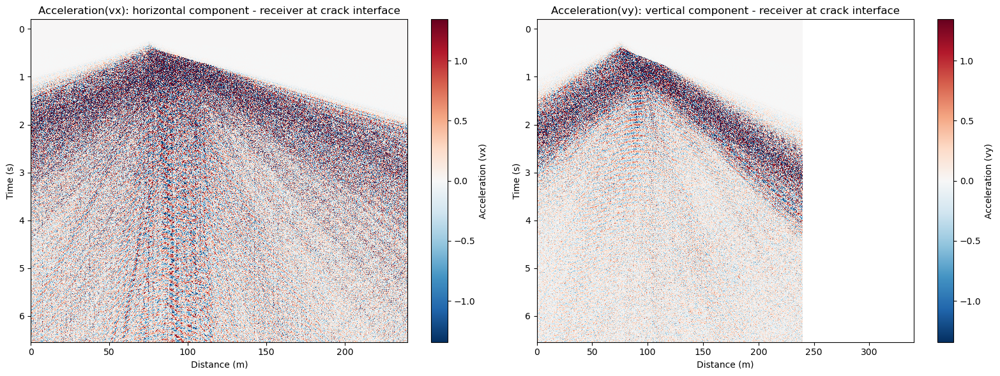

In [ ]:
acc_2d_layered = vel_2d_layered.differentiate(t_name)


# Force inline display in case backend was set to Agg earlier
import matplotlib.pyplot as plt
from IPython.display import display

# Define receiver line 
y_surface = 0.45 # 

# dis_2d_layered is already an xarray built from all events.
# Use direct selection instead of calling wavefield_output_to_xarray again.
    
# Resolve coordinate / dimension names robustly.
coords_set = set(acc_2d_layered.coords)
dims_set = set(acc_2d_layered.dims)

x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

if x_name is None or y_name is None or t_name is None or c_name is None:
    raise ValueError(f"Could not resolve required dimensions. Found dims={acc_2d_layered.dims}, coords={list(acc_2d_layered.coords)}")

# Select both components at y receiver line
sg_vx = acc_2d_layered.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
sg_vy = acc_2d_layered.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# Keep all moving-source events by reducing event dimension to a single stacked section.
if e_name is not None and e_name in sg_vx.dims:
    sg_vx_plot = sg_vx.mean(dim=e_name)
    sg_vy_plot = sg_vy.mean(dim=e_name)
else:
    sg_vx_plot = sg_vx
    sg_vy_plot = sg_vy

# Ensure plotting order is (time, x)
sg_vx_plot = sg_vx_plot.transpose(t_name, x_name)
sg_vy_plot = sg_vy_plot.transpose(t_name, x_name)

t_vals = sg_vx_plot[t_name].values
x_line = sg_vx_plot[x_name].values
data_vx = sg_vx_plot.values
data_vy = sg_vy_plot.values

print("Using dimensions:", {"x": x_name, "y": y_name, "t": t_name, "c": c_name, "event": e_name})
print("t range:", t_vals[0], "->", t_vals[-1])
print("vx shape:", data_vx.shape)
print("vy shape:", data_vy.shape)

# Clip colorscale (use same scale for both for comparison)
vmax = np.percentile(np.abs([data_vx, data_vy]), 95)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot vx (horizontal component)
im_vx = axes[0].pcolormesh(
    x_line,
    t_vals,
    data_vx,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[0].invert_yaxis()

# Mark all moving source positions
# for x_src in x_positions:
#     axes[0].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_xlim(0, 240)
axes[0].set_title("Acceleration(vx): horizontal component - receiver at crack interface")
plt.colorbar(im_vx, ax=axes[0], label="Acceleration (vx)")

# Plot vy (vertical component)
im_vy = axes[1].pcolormesh(
    x_line,
    t_vals,
    data_vy,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[1].invert_yaxis()

# # Mark all moving source positions
# for x_src in x_positions:
#     axes[1].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_xlim(0, 240)
axes[1].set_title("Acceleration(vy): vertical component - receiver at crack interface")
plt.colorbar(im_vy, ax=axes[1], label="Acceleration (vy)")

plt.tight_layout()

# Display explicitly in notebook output
display(fig)
plt.close(fig)


Using dimensions: {'x': 'x', 'y': 'y', 't': 't', 'c': 'c', 'event': None}
t range: -0.2 -> 6.545174858713123
vx shape: (7716, 1601)
vy shape: (7716, 1601)


/tmp/ipykernel_287796/1098832962.py:56: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vx = axes[0].pcolormesh(
/tmp/ipykernel_287796/1098832962.py:78: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vy = axes[1].pcolormesh(


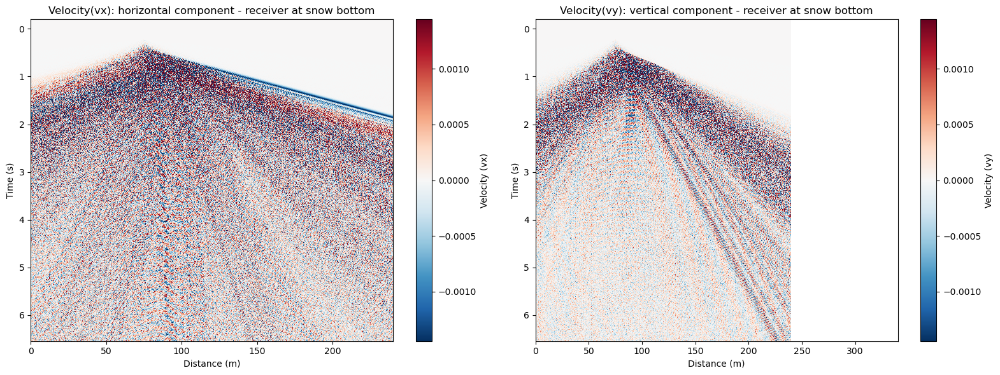

: 

In [ ]:
# Force inline display in case backend was set to Agg earlier
import matplotlib.pyplot as plt
from IPython.display import display

# Define receiver line 
y_surface = 0.0 # 

# dis_2d_layered is already an xarray built from all events.
# Use direct selection instead of calling wavefield_output_to_xarray again.
    
# Resolve coordinate / dimension names robustly.
coords_set = set(vel_2d_layered.coords)
dims_set = set(vel_2d_layered.dims)

x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

if x_name is None or y_name is None or t_name is None or c_name is None:
    raise ValueError(f"Could not resolve required dimensions. Found dims={vel_2d_layered.dims}, coords={list(vel_2d_layered.coords)}")

# Select both components at y receiver line
sg_vx = vel_2d_layered.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
sg_vy = vel_2d_layered.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# Keep all moving-source events by reducing event dimension to a single stacked section.
if e_name is not None and e_name in sg_vx.dims:
    sg_vx_plot = sg_vx.mean(dim=e_name)
    sg_vy_plot = sg_vy.mean(dim=e_name)
else:
    sg_vx_plot = sg_vx
    sg_vy_plot = sg_vy

# Ensure plotting order is (time, x)
sg_vx_plot = sg_vx_plot.transpose(t_name, x_name)
sg_vy_plot = sg_vy_plot.transpose(t_name, x_name)

t_vals = sg_vx_plot[t_name].values
x_line = sg_vx_plot[x_name].values
data_vx = sg_vx_plot.values
data_vy = sg_vy_plot.values

print("Using dimensions:", {"x": x_name, "y": y_name, "t": t_name, "c": c_name, "event": e_name})
print("t range:", t_vals[0], "->", t_vals[-1])
print("vx shape:", data_vx.shape)
print("vy shape:", data_vy.shape)

# Clip colorscale (use same scale for both for comparison)
vmax = np.percentile(np.abs([data_vx, data_vy]), 95)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot vx (horizontal component)
im_vx = axes[0].pcolormesh(
    x_line,
    t_vals,
    data_vx,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[0].invert_yaxis()

# Mark all moving source positions
# for x_src in x_positions:
#     axes[0].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_xlim(0, 240)
axes[0].set_title("Velocity(vx): horizontal component - receiver at snow bottom")
plt.colorbar(im_vx, ax=axes[0], label="Velocity (vx)")

# Plot vy (vertical component)
im_vy = axes[1].pcolormesh(
    x_line,
    t_vals,
    data_vy,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[1].invert_yaxis()

# # Mark all moving source positions
# for x_src in x_positions:
#     axes[1].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_xlim(0, 240)
axes[1].set_title("Velocity(vy): vertical component - receiver at snow bottom")
plt.colorbar(im_vy, ax=axes[1], label="Velocity (vy)")

plt.tight_layout()

# Display explicitly in notebook output
display(fig)
plt.close(fig)

Applying bandpass filter: 1.0 - 50.0 Hz...
Using dimensions: {'x': 'x', 'y': 'y', 't': 't', 'c': 'c', 'event': None}
t range: -0.2 -> 6.545174858713123
vx shape: (7716, 1601)
vy shape: (7716, 1601)


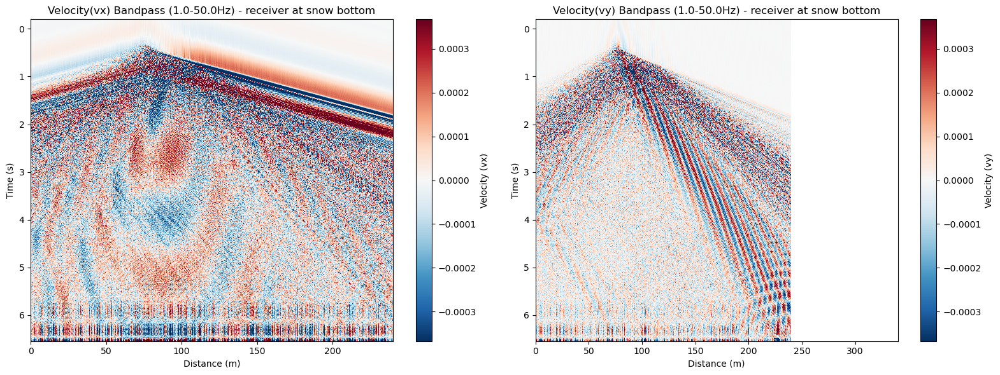

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
from scipy.signal import butter, sosfiltfilt
import xarray as xr

# ==========================================
# BANDPASS FILTER SETTINGS
# ==========================================
F_MIN = 1.0  # Minimum frequency (Hz)
F_MAX = 50.0  # Maximum frequency (Hz)

def bandpass_filter(da, t_dim, f_min, f_max):
    """Applies a zero-phase Butterworth bandpass filter along the time dimension."""
    t_vals = da[t_dim].values
    dt = float(np.mean(np.diff(t_vals)))
    fs = 1.0 / dt
    
    # Create 4th-order Butterworth bandpass filter
    sos = butter(4, [f_min, f_max], btype='bandpass', fs=fs, output='sos')
    
    # Apply filter along the time axis
    axis = da.dims.index(t_dim)
    filtered_data = sosfiltfilt(sos, da.values, axis=axis)
    
    return xr.DataArray(filtered_data, coords=da.coords, dims=da.dims)
# ==========================================

# Define receiver line 
y_surface = 0.0 

# Resolve coordinate / dimension names robustly.
coords_set = set(vel_2d_layered.coords)
dims_set = set(vel_2d_layered.dims)

x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

if x_name is None or y_name is None or t_name is None or c_name is None:
    raise ValueError(f"Could not resolve required dimensions. Found dims={vel_2d_layered.dims}, coords={list(vel_2d_layered.coords)}")

# Select both components at y receiver line
sg_vx = vel_2d_layered.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
sg_vy = vel_2d_layered.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# Keep all moving-source events by reducing event dimension to a single stacked section.
if e_name is not None and e_name in sg_vx.dims:
    sg_vx_plot = sg_vx.mean(dim=e_name)
    sg_vy_plot = sg_vy.mean(dim=e_name)
else:
    sg_vx_plot = sg_vx
    sg_vy_plot = sg_vy

# --- APPLY BANDPASS FILTER HERE ---
print(f"Applying bandpass filter: {F_MIN} - {F_MAX} Hz...")
sg_vx_plot = bandpass_filter(sg_vx_plot, t_dim=t_name, f_min=F_MIN, f_max=F_MAX)
sg_vy_plot = bandpass_filter(sg_vy_plot, t_dim=t_name, f_min=F_MIN, f_max=F_MAX)
# ----------------------------------

# Ensure plotting order is (time, x)
sg_vx_plot = sg_vx_plot.transpose(t_name, x_name)
sg_vy_plot = sg_vy_plot.transpose(t_name, x_name)

t_vals = sg_vx_plot[t_name].values
x_line = sg_vx_plot[x_name].values
data_vx = sg_vx_plot.values
data_vy = sg_vy_plot.values

print("Using dimensions:", {"x": x_name, "y": y_name, "t": t_name, "c": c_name, "event": e_name})
print("t range:", t_vals[0], "->", t_vals[-1])
print("vx shape:", data_vx.shape)
print("vy shape:", data_vy.shape)

# Clip colorscale (use same scale for both for comparison)
vmax = np.percentile(np.abs([data_vx, data_vy]), 95)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot vx (horizontal component)
im_vx = axes[0].pcolormesh(
    x_line,
    t_vals,
    data_vx,
    shading="auto",  # Note: changed from "none" to "auto" to prevent matplotlib errors
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[0].invert_yaxis()

axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_xlim(0, 240)
axes[0].set_title(f"Velocity(vx) Bandpass ({F_MIN}-{F_MAX}Hz) - receiver at snow bottom")
plt.colorbar(im_vx, ax=axes[0], label="Velocity (vx)")

# Plot vy (vertical component)
im_vy = axes[1].pcolormesh(
    x_line,
    t_vals,
    data_vy,
    shading="auto",  # Note: changed from "none" to "auto" to prevent matplotlib errors
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[1].invert_yaxis()

axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_xlim(0, 240)
axes[1].set_title(f"Velocity(vy) Bandpass ({F_MIN}-{F_MAX}Hz) - receiver at snow bottom")
plt.colorbar(im_vy, ax=axes[1], label="Velocity (vy)")

plt.tight_layout()

# Display explicitly in notebook output
display(fig)
plt.close(fig)

In [39]:
# loading displacement
# Extract displacement wavefield output from the single combined run.
czm_output_folder = str(pathlib.Path(PROJECT_DIR) / "custom_job_moving_source_all_sources")
vol_file = pathlib.Path(czm_output_folder) / "volume_data_output.h5"
if not vol_file.exists():
    raise RuntimeError(
        f"Missing output file: {vol_file}. Re-run the launch cell and verify the job completed."
    )

dis_wo = wavefield_output.WavefieldOutput.from_file(
    vol_file,
    "displacement",
    "volume",
)

dis_2d_layered = wavefield_output.wavefield_output_to_xarray(
    dis_wo,
    points=[np.linspace(0, 240, 500), np.linspace(0, 2.25, 101)],
)

print(f"Loaded displacement from {vol_file}")
print(f"Shape: {dis_2d_layered.dims}")
print(dis_2d_layered)

# Take the spatial derivative of the layered displacement field along x.
x_dim = next((dim for dim in ["x", "X", "p0", "dim_0"] if dim in dis_2d_layered.dims or dim in dis_2d_layered.coords), None)

if x_dim is None:
    raise ValueError(
        f"Could not find an x-like spatial dimension in dims={dis_2d_layered.dims}, coords={list(dis_2d_layered.coords)}"
    )

dis_2d_layered_dx = dis_2d_layered.differentiate(x_dim)

print(f"Computed spatial derivative d/d{x_dim} for dis_2d_layered")
print(dis_2d_layered_dx)

Finding enclosing elements (pass 1 of auto):   0%|          | 0/50500 [00:00<?, ?it/s]

Finding enclosing elements (pass 2 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 3 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 4 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 5 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

Finding enclosing elements (pass 6 of auto):   0%|          | 0/33500 [00:00<?, ?it/s]

[2026-07-28 09:39:28,831] WARNING - salvus.mesh.algorithms.unstructured_mesh.utils: 33500 points were not claimed by enclosing elements. Depending on your use case, this may not be an issue.


Extracting wavefield to regular grid:   0%|          | 0/2 [00:00<?, ?it/s]

Loaded displacement from simulation_wavefield_custom_stf_from_mpm_original_parameters_DENSE/custom_job_moving_source_all_sources/volume_data_output.h5
Shape: ('t', 'c', 'x', 'y')
<xarray.DataArray (t: 5863, c: 2, x: 500, y: 101)> Size: 2GB
array([[[[ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         ...,
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan],
         [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
                     nan,            nan,            nan]],

        [[ 0

Using dimensions: {'x': 'x', 'y': 'y', 't': 't', 'c': 'c', 'event': None}
t range: -0.2 -> 6.545583036859777
vx shape: (5863, 500)
vy shape: (5863, 500)


/tmp/ipykernel_401525/1769642793.py:60: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vx = axes[0].pcolormesh(
/tmp/ipykernel_401525/1769642793.py:82: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vy = axes[1].pcolormesh(


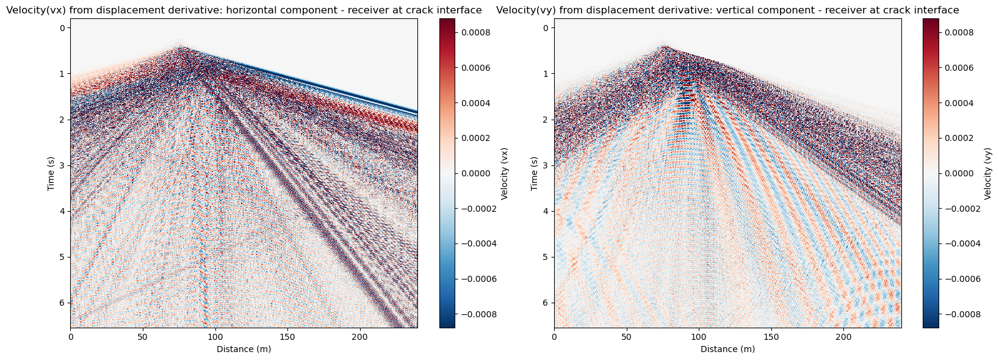

In [40]:
# instead of velocity: temporal derivative of displacement to get velocity


# plotting displacement temporal derivative (velocity)
# Force inline display in case backend was set to Agg earlier
import matplotlib.pyplot as plt
from IPython.display import display

# Define receiver line 
y_surface = 0.45 # 

# dis_2d_layered is already an xarray built from all events.
# Use direct selection instead of calling wavefield_output_to_xarray again.
    
# Resolve coordinate / dimension names robustly.
coords_set = set(dis_2d_layered.coords)
dims_set = set(dis_2d_layered.dims)

x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)
dis_2d_layered_dt = dis_2d_layered.differentiate(t_name)
if x_name is None or y_name is None or t_name is None or c_name is None:
    raise ValueError(f"Could not resolve required dimensions. Found dims={dis_2d_layered_dt.dims}, coords={list(dis_2d_layered_dt.coords)}")

# Select both components at y receiver line
sg_vx = dis_2d_layered_dt.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
sg_vy = dis_2d_layered_dt.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# Keep all moving-source events by reducing event dimension to a single stacked section.
if e_name is not None and e_name in sg_vx.dims:
    sg_vx_plot = sg_vx.mean(dim=e_name)
    sg_vy_plot = sg_vy.mean(dim=e_name)
else:
    sg_vx_plot = sg_vx
    sg_vy_plot = sg_vy

# Ensure plotting order is (time, x)
sg_vx_plot = sg_vx_plot.transpose(t_name, x_name)
sg_vy_plot = sg_vy_plot.transpose(t_name, x_name)

t_vals = sg_vx_plot[t_name].values
x_line = sg_vx_plot[x_name].values
data_vx = sg_vx_plot.values
data_vy = sg_vy_plot.values

print("Using dimensions:", {"x": x_name, "y": y_name, "t": t_name, "c": c_name, "event": e_name})
print("t range:", t_vals[0], "->", t_vals[-1])
print("vx shape:", data_vx.shape)
print("vy shape:", data_vy.shape)

# Clip colorscale (use same scale for both for comparison)
vmax = np.percentile(np.abs([data_vx, data_vy]), 95)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot vx (horizontal component)
im_vx = axes[0].pcolormesh(
    x_line,
    t_vals,
    data_vx,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[0].invert_yaxis()

# Mark all moving source positions
# for x_src in x_positions:
#     axes[0].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_xlim(0, 240)
axes[0].set_title("Velocity(vx) from displacement derivative: horizontal component - receiver at crack interface")
plt.colorbar(im_vx, ax=axes[0], label="Velocity (vx)")

# Plot vy (vertical component)
im_vy = axes[1].pcolormesh(
    x_line,
    t_vals,
    data_vy,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[1].invert_yaxis()

# # Mark all moving source positions
# for x_src in x_positions:
#     axes[1].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_xlim(0, 240)
axes[1].set_title("Velocity(vy) from displacement derivative: vertical component - receiver at crack interface")
plt.colorbar(im_vy, ax=axes[1], label="Velocity (vy)")

plt.tight_layout()

# Display explicitly in notebook output
display(fig)
plt.close(fig)

Using dimensions: {'x': 'x', 'y': 'y', 't': 't', 'c': 'c', 'event': None}
t range: -0.2 -> 6.545583036859777
vx shape: (5863, 500)
vy shape: (5863, 500)


/tmp/ipykernel_401525/531655346.py:60: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vx = axes[0].pcolormesh(
/tmp/ipykernel_401525/531655346.py:82: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vy = axes[1].pcolormesh(


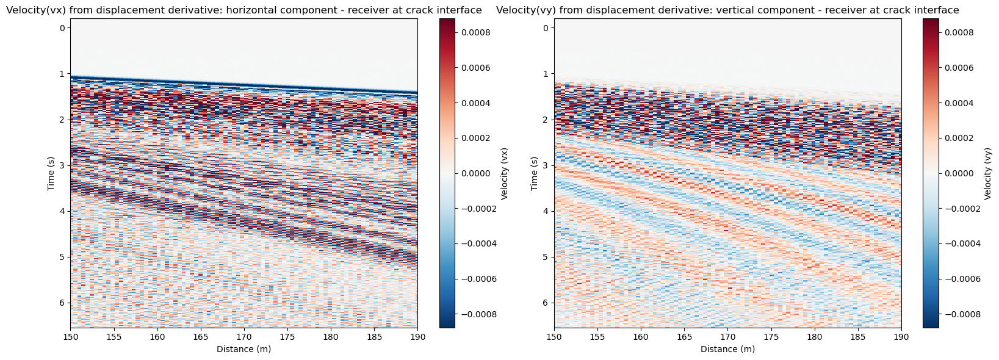

In [41]:
# instead of velocity: temporal derivative of displacement to get velocity
dis_2d_layered_dt = dis_2d_layered.differentiate(t_name)

# plotting displacement temporal derivative (velocity)
# Force inline display in case backend was set to Agg earlier
import matplotlib.pyplot as plt
from IPython.display import display

# Define receiver line 
y_surface = 0.45 # 

# dis_2d_layered is already an xarray built from all events.
# Use direct selection instead of calling wavefield_output_to_xarray again.
    
# Resolve coordinate / dimension names robustly.
coords_set = set(dis_2d_layered_dt.coords)
dims_set = set(dis_2d_layered_dt.dims)

x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

if x_name is None or y_name is None or t_name is None or c_name is None:
    raise ValueError(f"Could not resolve required dimensions. Found dims={dis_2d_layered_dt.dims}, coords={list(dis_2d_layered_dt.coords)}")

# Select both components at y receiver line
sg_vx = dis_2d_layered_dt.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
sg_vy = dis_2d_layered_dt.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# Keep all moving-source events by reducing event dimension to a single stacked section.
if e_name is not None and e_name in sg_vx.dims:
    sg_vx_plot = sg_vx.mean(dim=e_name)
    sg_vy_plot = sg_vy.mean(dim=e_name)
else:
    sg_vx_plot = sg_vx
    sg_vy_plot = sg_vy

# Ensure plotting order is (time, x)
sg_vx_plot = sg_vx_plot.transpose(t_name, x_name)
sg_vy_plot = sg_vy_plot.transpose(t_name, x_name)

t_vals = sg_vx_plot[t_name].values
x_line = sg_vx_plot[x_name].values
data_vx = sg_vx_plot.values
data_vy = sg_vy_plot.values

print("Using dimensions:", {"x": x_name, "y": y_name, "t": t_name, "c": c_name, "event": e_name})
print("t range:", t_vals[0], "->", t_vals[-1])
print("vx shape:", data_vx.shape)
print("vy shape:", data_vy.shape)

# Clip colorscale (use same scale for both for comparison)
vmax = np.percentile(np.abs([data_vx, data_vy]), 95)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot vx (horizontal component)
im_vx = axes[0].pcolormesh(
    x_line,
    t_vals,
    data_vx,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[0].invert_yaxis()

# Mark all moving source positions
# for x_src in x_positions:
#     axes[0].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_xlim(150, 190)
axes[0].set_title("Velocity(vx) from displacement derivative: horizontal component - receiver at crack interface")
plt.colorbar(im_vx, ax=axes[0], label="Velocity (vx)")

# Plot vy (vertical component)
im_vy = axes[1].pcolormesh(
    x_line,
    t_vals,
    data_vy,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[1].invert_yaxis()

# # Mark all moving source positions
# for x_src in x_positions:
#     axes[1].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_xlim(150, 190)
axes[1].set_title("Velocity(vy) from displacement derivative: vertical component - receiver at crack interface")
plt.colorbar(im_vy, ax=axes[1], label="Velocity (vy)")

plt.tight_layout()

# Display explicitly in notebook output
display(fig)
plt.close(fig)

In [42]:
from scipy.signal import butter, filtfilt

def lowpass_filter(da, t_dim, f_max=50.0, order=4):
    """
    Applies a zero-phase Butterworth low-pass filter along the time dimension of an xarray DataArray.
    """
    t_vals = da[t_dim].values
    dt = float(np.mean(np.diff(t_vals)))
    fs = 1.0 / dt
    nyquist = 0.5 * fs
    
    # Ensure cutoff frequency is below Nyquist frequency
    cutoff = min(f_max, nyquist * 0.95) / nyquist
    b, a = butter(order, cutoff, btype='low', analog=False)
    
    axis = da.dims.index(t_dim)
    filtered_data = filtfilt(b, a, da.values, axis=axis)
    
    return xr.DataArray(filtered_data, coords=da.coords, dims=da.dims)

Using dimensions: {'x': 'x', 'y': 'y', 't': 't', 'c': 'c', 'event': None}
t range: -0.2 -> 6.545583036859777
vx shape: (5863, 500)
vy shape: (5863, 500)


/tmp/ipykernel_401525/2626018053.py:58: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vx = axes[0].pcolormesh(
/tmp/ipykernel_401525/2626018053.py:80: UserWarning: shading value 'none' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im_vy = axes[1].pcolormesh(


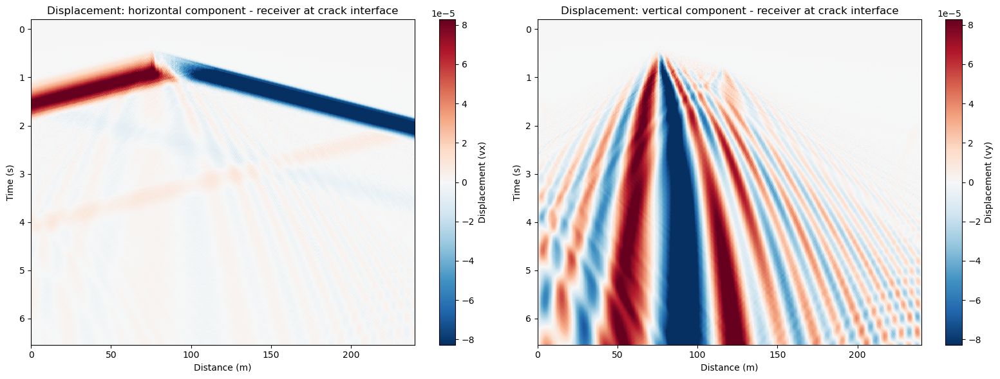

In [43]:
# plotting displacement
# Force inline display in case backend was set to Agg earlier
import matplotlib.pyplot as plt
from IPython.display import display

# Define receiver line 
y_surface =0.525 

# dis_2d_layered is already an xarray built from all events.
# Use direct selection instead of calling wavefield_output_to_xarray again.
    
# Resolve coordinate / dimension names robustly.
coords_set = set(dis_2d_layered.coords)
dims_set = set(dis_2d_layered.dims)

x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

if x_name is None or y_name is None or t_name is None or c_name is None:
    raise ValueError(f"Could not resolve required dimensions. Found dims={vel_2d_layered.dims}, coords={list(vel_2d_layered.coords)}")

# Select both components at y receiver line
dis_vx = dis_2d_layered.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
dis_vy = dis_2d_layered.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# Keep all moving-source events by reducing event dimension to a single stacked section.
if e_name is not None and e_name in dis_vx.dims:
    dis_vx_plot = dis_vx.mean(dim=e_name)
    dis_vy_plot = dis_vy.mean(dim=e_name)
else:
    dis_vx_plot = dis_vx
    dis_vy_plot = dis_vy

# Ensure plotting order is (time, x)
dis_vx_plot = dis_vx_plot.transpose(t_name, x_name)
dis_vy_plot = dis_vy_plot.transpose(t_name, x_name)

t_vals = dis_vx_plot[t_name].values
x_line = dis_vx_plot[x_name].values
data_vx = dis_vx_plot.values
data_vy = dis_vy_plot.values

print("Using dimensions:", {"x": x_name, "y": y_name, "t": t_name, "c": c_name, "event": e_name})
print("t range:", t_vals[0], "->", t_vals[-1])
print("vx shape:", data_vx.shape)
print("vy shape:", data_vy.shape)

# Clip colorscale (use same scale for both for comparison)
vmax = np.percentile(np.abs([data_vx, data_vy]), 95)
#vmax = 1e-7

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot vx (horizontal component)
im_vx = axes[0].pcolormesh(
    x_line,
    t_vals,
    data_vx,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[0].invert_yaxis()

# Mark all moving source positions
# for x_src in x_positions:
#     axes[0].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_xlim(0, 240)
axes[0].set_title("Displacement: horizontal component - receiver at crack interface")
plt.colorbar(im_vx, ax=axes[0], label="Displacement (vx)")

# Plot vy (vertical component)
im_vy = axes[1].pcolormesh(
    x_line,
    t_vals,
    data_vy,
    shading="none",
    cmap="RdBu_r",
    vmin=-vmax,
    vmax=vmax,
)
axes[1].invert_yaxis()

# # Mark all moving source positions
# for x_src in x_positions:
#     axes[1].axvline(x=x_src, color="teal", lw=0.5, linestyle="--", alpha=0.35)

axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_xlim(0, 240)
axes[1].set_title("Displacement: vertical component - receiver at crack interface")
plt.colorbar(im_vy, ax=axes[1], label="Displacement (vy)")

plt.tight_layout()

# Display explicitly in notebook output
display(fig)
plt.close(fig)

Computing velocity using Spectral Derivative with cutoff at 30.0 Hz...


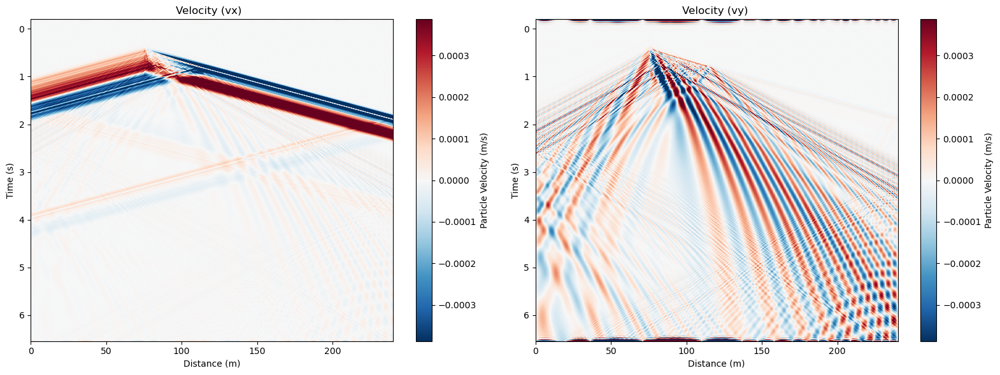

In [44]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy.fft import rfft, irfft, rfftfreq
from IPython.display import display

# Dimensions
coords_set = set(dis_2d_layered.coords)
dims_set = set(dis_2d_layered.dims)
x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

# Spectral derivative function
def spectral_derivative(da, t_dim, f_max):
    t_vals = da[t_dim].values
    dt = float(np.mean(np.diff(t_vals)))
    n = da.sizes[t_dim]
    axis = da.dims.index(t_dim)
    data = da.values
    
    freqs = rfftfreq(n, d=dt)
    fft_vals = rfft(data, axis=axis)
    
    omega = 2 * np.pi * freqs
    shape = [1] * data.ndim
    shape[axis] = len(freqs)
    omega = omega.reshape(shape)
    
    d_fft = 1j * omega * fft_vals
    
    taper = np.ones_like(freqs)
    f_start = 0.7 * f_max 
    mask = freqs > f_start
    taper[mask] = 0.5 * (1 + np.cos(np.pi * (freqs[mask] - f_start) / (f_max - f_start)))
    taper[freqs > f_max] = 0.0
    
    taper = taper.reshape(shape)
    d_fft_clean = d_fft * taper
    
    deriv_data = irfft(d_fft_clean, n=n, axis=axis)
    return xr.DataArray(deriv_data, coords=da.coords, dims=da.dims)

# Computing fileterd velocity
PHYSICAL_FMAX = 30.0  
print("Computing velocity using Spectral Derivative with cutoff at", PHYSICAL_FMAX, "Hz...")
dis_2d_layered_dt = spectral_derivative(dis_2d_layered, t_dim=t_name, f_max=PHYSICAL_FMAX)

# Extract reciever line
y_surface = 0.45
sg_vx = dis_2d_layered_dt.isel({c_name: 0}).sel({y_name: y_surface}, method="nearest")
sg_vy = dis_2d_layered_dt.isel({c_name: 1}).sel({y_name: y_surface}, method="nearest")

# averaging, sort, interpolate events to uniform grid 
if e_name is not None and e_name in sg_vx.dims:
    sg_vx_plot = sg_vx.mean(dim=e_name)
    sg_vy_plot = sg_vy.mean(dim=e_name)
else:
    sg_vx_plot = sg_vx
    sg_vy_plot = sg_vy

# Sort X spatially to prevent pcolormesh draw artifacts
sg_vx_plot = sg_vx_plot.sortby(x_name)
sg_vy_plot = sg_vy_plot.sortby(x_name)

# Interpolate to uniform grid to eliminate GLL mesh checkerboarding
x_uniform = np.linspace(0, 240.0, 1000)
sg_vx_plot = sg_vx_plot.interp({x_name: x_uniform}, method="linear")
sg_vy_plot = sg_vy_plot.interp({x_name: x_uniform}, method="linear")

# Ensure transpose is correct for plotting
sg_vx_plot = sg_vx_plot.transpose(t_name, x_name)
sg_vy_plot = sg_vy_plot.transpose(t_name, x_name)

# Plottting 
t_vals = sg_vx_plot[t_name].values
x_line = sg_vx_plot[x_name].values
data_vx = sg_vx_plot.values
data_vy = sg_vy_plot.values

vmax = np.percentile(np.abs([data_vx, data_vy]), 98)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

im_vx = axes[0].pcolormesh(x_line, t_vals, data_vx, shading="auto", cmap="RdBu_r", vmin=-vmax, vmax=vmax)
axes[0].invert_yaxis()
axes[0].set_xlabel("Distance (m)")
axes[0].set_ylabel("Time (s)")
axes[0].set_title("Velocity (vx)  ")
plt.colorbar(im_vx, ax=axes[0], label="Particle Velocity (m/s)")

im_vy = axes[1].pcolormesh(x_line, t_vals, data_vy, shading="auto", cmap="RdBu_r", vmin=-vmax, vmax=vmax)
axes[1].invert_yaxis()
axes[1].set_xlabel("Distance (m)")
axes[1].set_ylabel("Time (s)")
axes[1].set_title("Velocity (vy) ")
plt.colorbar(im_vy, ax=axes[1], label="Particle Velocity (m/s)")

plt.tight_layout()
display(fig)
plt.close(fig)

In [46]:
# pyber, developed by Mondaic
# Copyright (C) 2024, Institute for Geophysics, ETH Zurich
# All rights reserved
"""
The gauge length object.
"""
from __future__ import annotations

import typing

import matplotlib.pyplot as plt
import numpy as np
import numpy.typing as npt
import scipy.signal


class GaugeLength:
    def __init__(
        self,
        distances_in_m: npt.ArrayLike,
        weights: npt.ArrayLike,
        gl_type: typing.Optional[str] = None,
    ):
        """
        An object representing a gauge length to integrate measurements over.

        Args:
            distances_in_m: Relative distance in meters.
            weights: The weight of the measurement at each distance.
        """
        self.distances_in_m = np.array(distances_in_m, dtype=np.float64)
        self.weights = np.array(weights, dtype=np.float64)
        self.type = gl_type

        if self.distances_in_m.ndim != 1 or self.weights.ndim != 1:
            raise ValueError(
                "Both distances_in_m and weights must be 1-D arrays."
            )

        if self.distances_in_m.shape != self.weights.shape:
            raise ValueError("Distance and weights must have the same shape.")

    def __eq__(self, other):
        if not isinstance(self, type(other)):
            return False
        return np.allclose(
            self.distances_in_m, other.distances_in_m
        ) and np.allclose(self.weights, other.weights)

    def __ne__(self, other):
        return not self == other

    @classmethod
    def single_point(cls) -> GaugeLength:
        """
        Return a gauge length object with a single point and unit weight.
        """
        return cls(distances_in_m=[0.0], weights=[1.0], gl_type="single")

    @classmethod
    def simple_difference(cls, width_in_m: float) -> GaugeLength:
        """
        Return a gauge length object where the starting and end point of the
        gauge length are subtracted from each other.

        Args:
            width_in_m: The total width of the integration points. Half will be
                to the left, and half to the right of the sample point.
        """
        return cls(
            distances_in_m=np.array([-width_in_m / 2.0, width_in_m / 2]),
            weights=np.array([-1.0 / width_in_m, 1.0 / width_in_m]),
            gl_type="diff",
        )

    @classmethod
    def constant(cls, width_in_m: float, n_samples: int) -> GaugeLength:
        """
        Return a gauge length object with constant weights over a given
        distance.

        Args:
            width_in_m: The total width of the integration points. Half will be
                to the left, and half to the right of the sample point.
            n_samples: The number of samples.
        """
        if n_samples == 1:
            return cls.single_point()

        distances_in_m = np.linspace(
            -width_in_m / 2.0, width_in_m / 2.0, n_samples
        )
        weights = np.ones_like(distances_in_m)
        return cls(
            distances_in_m=distances_in_m, weights=weights, gl_type="constant"
        ).normalize()

    @classmethod
    def gaussian(
        cls, width_in_m: float, n_samples: int, std: float
    ) -> GaugeLength:
        """
        Return a gauge length object with weights distributed according to a
        Gaussian around the sample point.

        Args:
            width_in_m: The total width of the integration points. Half will be
                to the left, and half to the right of the sample point.
            n_samples: The number of samples.
            std: The standard deviation of the Gaussian in meters.
        """
        if n_samples == 1:
            return cls.single_point()

        distances_in_m = np.linspace(
            -width_in_m / 2.0, width_in_m / 2.0, n_samples
        )

        dx = distances_in_m[1] - distances_in_m[0]

        weights = scipy.signal.windows.gaussian(
            n_samples, std=std / dx, sym=True
        )
        return cls(
            distances_in_m=distances_in_m, weights=weights, gl_type="gaussian"
        ).normalize()

    def get_integration_points_and_weights(
        self,
    ) -> typing.Tuple[npt.NDArray[np.float64], npt.NDArray[np.float64]]:
        """
        Returns a tuple of integration points and weights to evaluate the
        integral under the curve using the trapezoid rule honoring the
        additional custom weights.
        """
        if len(self.distances_in_m) == 1:
            return (
                np.require(self.distances_in_m.copy(), dtype=np.float64),
                np.require(self.weights.copy(), dtype=np.float64),
            )

        dx = np.diff(self.distances_in_m)
        weights = np.zeros(len(self.distances_in_m), dtype=np.float64)

        # Trapezoid rule, written per integration point.
        weights[:-1] = self.weights[:-1] / 2.0 * dx
        weights[1:] = self.weights[1:] / 2.0 * dx

        return (
            np.require(self.distances_in_m.copy(), dtype=np.float64),
            weights,
        )

    def compute_integral_of_weights(self) -> float:
        """
        Compute the integrated area of the weights. In most cases this should
        likely be 1.
        """
        if len(self.weights) == 1:
            return 1.0
        return (
            self.get_integration_points_and_weights()[1]
            * np.ones_like(self.weights)
        ).sum()

    def normalize(self) -> GaugeLength:
        """
        Normalize the integrated area using the weights.
        """
        return GaugeLength(
            distances_in_m=self.distances_in_m.copy(),
            weights=self.weights / self.compute_integral_of_weights(),
            gl_type=self.type,
        )

    def plot(self):
        """
        Plot the gauge length.
        """
        plt.fill_between(
            x=self.distances_in_m,
            y1=np.zeros_like(self.weights),
            y2=self.weights,
            facecolor="none",
            hatch="///",
            edgecolor="0.7",
        )
        plt.stem(self.distances_in_m, self.weights)
        plt.hlines(y=0, xmin=-100, xmax=100, lw=0.2, color="0.3")
        plt.vlines(x=0, ymin=-100, ymax=100, lw=0.2, color="0.3")

        plt.xlabel("Relative position around sample point [meter]")
        plt.ylabel("Additional weight of each integration point")

        y_buf = 0.25 * self.weights.max()
        plt.ylim(-y_buf, self.weights.max() + y_buf)

        d = np.abs(self.distances_in_m).max()
        if self.distances_in_m.ptp() == 0:
            d = 0.5
        x_buf = d * 0.5
        plt.xlim(-d - x_buf, d + x_buf)

        plt.title(
            f"Gauge length\n{len(self.weights)} integration points, "
            f"Integration area: {self.compute_integral_of_weights():.2f}"
        )
        plt.tight_layout()

        plt.show()


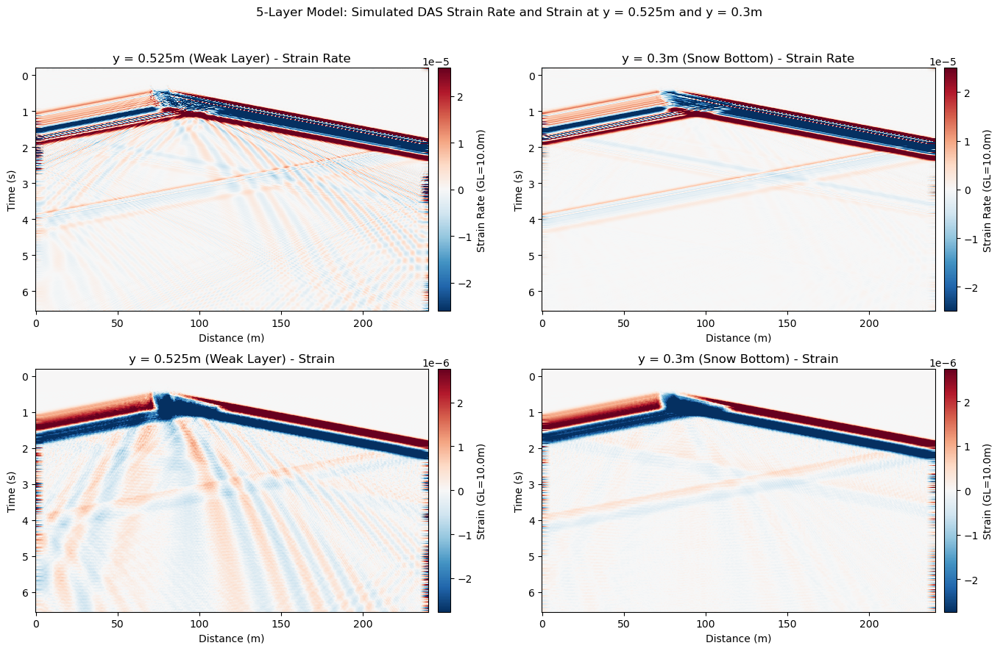

In [ ]:
from scipy.ndimage import convolve1d

# Define gauge length and receiver interfaces (5-Layer Model)
GAUGE_LENGTH_M = 1
receiver_lines = [ 0.525,0.3]  # Snow bottom and crack depth


def resolve_names(da):
    """Resolves x, y, t, component, and event dimension names."""
    coords_set = set(da.coords)
    dims_set = set(da.dims)

    x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
    y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
    t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
    c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
    e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

    return x_name, y_name, t_name, c_name, e_name


def extract_component_section(da, comp_idx, y_val):
    """Extracts a 2D line profile (t, x) at a specific y depth and component."""
    x_name, y_name, t_name, c_name, e_name = resolve_names(da)
    
    # Select component and slice near y_val
    sub = da.isel({c_name: comp_idx}).sel({y_name: y_val}, method="nearest")
    
    # Average across events if event dimension exists
    if e_name is not None and e_name in sub.dims:
        sub = sub.mean(dim=e_name)
        
    sub = sub.sortby(x_name)
    sub = sub.transpose(t_name, x_name)
    
    return sub, (x_name, y_name, t_name, c_name, e_name)


def lowpass_filter(da, t_dim, f_max):
    """Low-pass filter using cosine taper in the Fourier domain."""
    t_vals = da[t_dim].values
    dt = float(np.mean(np.diff(t_vals)))
    n = da.sizes[t_dim]
    axis = da.dims.index(t_dim)
    data = da.values

    freqs = rfftfreq(n, d=dt)
    fft_vals = rfft(data, axis=axis)

    taper = np.ones_like(freqs)
    f_start = 0.7 * f_max
    mask = freqs > f_start
    taper[mask] = 0.5 * (1 + np.cos(np.pi * (freqs[mask] - f_start) / (f_max - f_start)))
    taper[freqs > f_max] = 0.0

    shape = [1] * data.ndim
    shape[axis] = len(freqs)
    taper = taper.reshape(shape)

    fft_clean = fft_vals * taper
    filtered_data = irfft(fft_clean, n=n, axis=axis)
    return xr.DataArray(filtered_data, coords=da.coords, dims=da.dims)


def plot_das_strain_and_rate(case_name, displacement, gauge_length_m=GAUGE_LENGTH_M, f_max=50.0):
    sections = {}

    displacement_x_name, _, displacement_time_name, _, _ = resolve_names(displacement)

    # 1. Compute Horizontal Strain (du/dx)
    strain_x = displacement.differentiate(displacement_x_name)

    # 2. Compute Raw Strain Rate (d/dt of strain)
    strain_rate_x_raw = strain_x.differentiate(displacement_time_name)

    # 3. Low-Pass Filter Strain Rate to remove high-frequency derivative noise
    strain_rate_x = lowpass_filter(
        strain_rate_x_raw, t_dim=displacement_time_name, f_max=f_max
    )

    for y_surface in receiver_lines:
        local_strain, info = extract_component_section(strain_x, 0, y_surface)
        local_strain_rate, _ = extract_component_section(strain_rate_x, 0, y_surface)

        x_name, _, t_name, _, _ = info
        x_vals = local_strain[x_name].values
        t_vals = local_strain[t_name].values
        dx = float(np.mean(np.diff(x_vals)))

        # DAS Gauge Length Setup
        n_samples = max(int(np.round(gauge_length_m / dx)), 1)
        weights = np.ones(n_samples) / n_samples

        # Simulate DAS Integration along space (x-axis)
        das_strain = convolve1d(local_strain.values, weights, axis=1, mode="nearest")
        das_strain_rate = convolve1d(
            local_strain_rate.values, weights, axis=1, mode="nearest"
        )

        sections[y_surface] = {
            "strain": das_strain,
            "strain_rate": das_strain_rate,
            "x_vals": x_vals,
            "t_vals": t_vals,
        }

    # Plotting setup (2x2 grid)
    fig, axes = plt.subplots(2, 2, figsize=(14, 9), sharex=True, sharey=True)

    row_specs = [
        ("strain_rate", f"Strain Rate (GL={gauge_length_m}m)"),
        ("strain", f"Strain (GL={gauge_length_m}m)"),
    ]

    for col, y_surface in enumerate(receiver_lines):
        sec_data = sections[y_surface]
        x_vals = sec_data["x_vals"]
        t_vals = sec_data["t_vals"]

        for row, (data_key, cbar_label) in enumerate(row_specs):
            data = sec_data[data_key]
            scale = float(np.nanpercentile(np.abs(data), 95))
            if scale == 0.0:
                scale = 1.0

            im = axes[row, col].pcolormesh(
                x_vals,
                t_vals,
                data,
                shading="nearest",
                cmap="RdBu_r",
                vmin=-scale,
                vmax=scale,
            )

            depth_label = "Snow Bottom" if y_surface == 0.3 else "Weak Layer"
            axes[row, col].set_title(
                f"y = {y_surface}m ({depth_label}) - {data_key.replace('_', ' ').title()}"
            )

            axes[row, col].set_ylabel("Time (s)")
            axes[row, col].set_xlabel("Distance (m)")
            axes[row, col].tick_params(labelbottom=True, labelleft=True)

            cbar = fig.colorbar(im, ax=axes[row, col], pad=0.02)
            cbar.set_label(cbar_label)

    # Invert shared time axis properly
    t_min, t_max = t_vals.min(), t_vals.max()
    axes[0, 0].set_ylim(t_max, t_min)

    fig.suptitle(
        f"{case_name}: Simulated DAS Strain Rate and Strain at y = {receiver_lines[0]}m and y = {receiver_lines[1]}m ",
    )
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    display(fig)
    plt.close(fig)


# Execute DAS plot with 50Hz cutoff
plot_das_strain_and_rate(
    "5-Layer Model", dis_2d_layered, gauge_length_m=GAUGE_LENGTH_M, f_max=30.0
)

Computing velocity using Spectral Derivative with cutoff at 30.0 Hz...


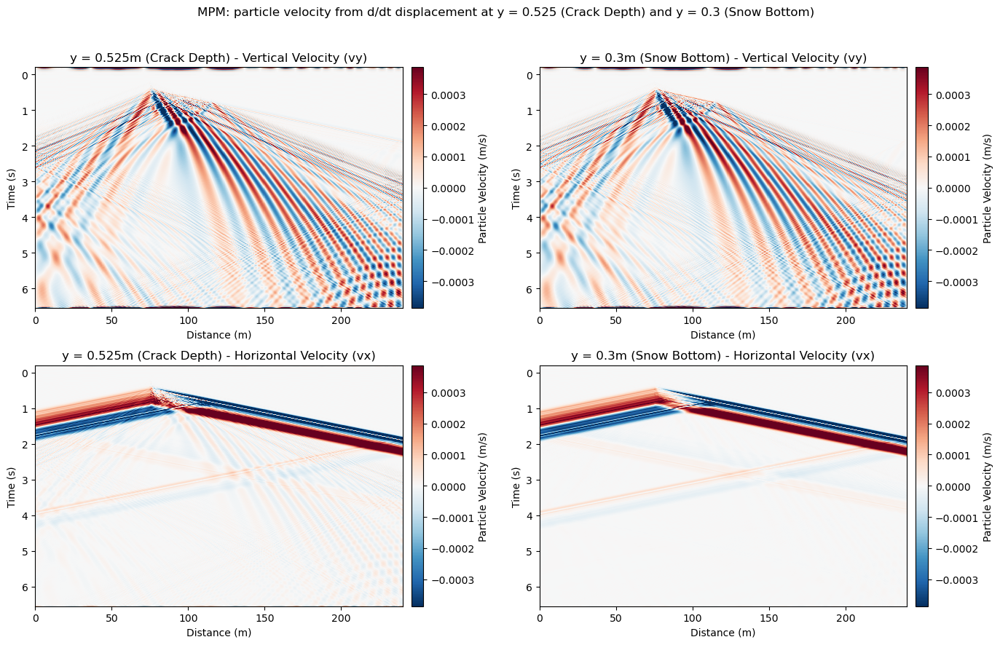

In [56]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from scipy.fft import rfft, irfft, rfftfreq
from IPython.display import display

# Resolve coordinates / dimensions
coords_set = set(dis_2d_layered.coords)
dims_set = set(dis_2d_layered.dims)
x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

# Spectral derivative function
def spectral_derivative(da, t_dim, f_max):
    t_vals = da[t_dim].values
    dt = float(np.mean(np.diff(t_vals)))
    n = da.sizes[t_dim]
    axis = da.dims.index(t_dim)
    data = da.values
    
    freqs = rfftfreq(n, d=dt)
    fft_vals = rfft(data, axis=axis)
    
    omega = 2 * np.pi * freqs
    shape = [1] * data.ndim
    shape[axis] = len(freqs)
    omega = omega.reshape(shape)
    
    d_fft = 1j * omega * fft_vals
    
    taper = np.ones_like(freqs)
    f_start = 0.7 * f_max 
    mask = freqs > f_start
    taper[mask] = 0.5 * (1 + np.cos(np.pi * (freqs[mask] - f_start) / (f_max - f_start)))
    taper[freqs > f_max] = 0.0
    
    taper = taper.reshape(shape)
    d_fft_clean = d_fft * taper
    
    deriv_data = irfft(d_fft_clean, n=n, axis=axis)
    return xr.DataArray(deriv_data, coords=da.coords, dims=da.dims)

# 1. Compute filtered velocity
PHYSICAL_FMAX = 30.0  
print("Computing velocity using Spectral Derivative with cutoff at", PHYSICAL_FMAX, "Hz...")
dis_2d_layered_dt = spectral_derivative(dis_2d_layered, t_dim=t_name, f_max=PHYSICAL_FMAX)

# 2. Define Depth Levels and Uniform Mesh
depths = [
    ("Crack Depth", 0.525),
    ("Snow Bottom", 0.300),  # Left Column (col 0)
       # Right Column (col 1)
]

x_uniform = np.linspace(0, 240.0, 1000)

# 3. Extract and process data for all 4 subplots
processed_data = {}
all_values_for_scale = []

for label, y_val in depths:
    processed_data[label] = {}
    
    # Component 0 = vx, Component 1 = vy
    for c_idx, c_label in [(0, "vx"), (1, "vy")]:
        sg = dis_2d_layered_dt.isel({c_name: c_idx}).sel({y_name: y_val}, method="nearest")
        
        if e_name is not None and e_name in sg.dims:
            sg = sg.mean(dim=e_name)
            
        sg = sg.sortby(x_name)
        sg = sg.interp({x_name: x_uniform}, method="linear")
        sg = sg.transpose(t_name, x_name)
        
        processed_data[label][c_label] = sg
        all_values_for_scale.append(sg.values)

# Shared color scale based on 98th percentile of all panels
vmax = float(np.percentile(np.abs(all_values_for_scale), 98))

# 4. Create 2x2 Plot
fig, axes = plt.subplots(2, 2, figsize=(14, 9), sharex=True, sharey=True)

# Row specs: Top = vy, Bottom = vx
row_specs = [
    ("vy", "Vertical Velocity (vy)"),      # Top Row (row 0)
    ("vx", "Horizontal Velocity (vx)"),    # Bottom Row (row 1)
]

for col_idx, (col_label, y_val) in enumerate(depths):
    for row_idx, (comp_key, comp_title) in enumerate(row_specs):
        
        da = processed_data[col_label][comp_key]
        t_vals = da[t_name].values
        x_line = da[x_name].values
        data = da.values
        
        ax = axes[row_idx, col_idx]
        im = ax.pcolormesh(
            x_line, t_vals, data, 
            shading="auto", cmap="RdBu_r", vmin=-vmax, vmax=vmax
        )
        
        ax.set_title(f"y = {y_val}m ({col_label}) - {comp_title}")
        
        ax.set_ylabel("Time (s)")
        ax.set_xlabel("Distance (m)")
        ax.tick_params(labelbottom=True, labelleft=True)
            
        cbar = fig.colorbar(im, ax=ax, pad=0.02)
        cbar.set_label("Particle Velocity (m/s)")

# Robustly invert the shared time axis (0 at top, max time at bottom)
t_min, t_max = t_vals.min(), t_vals.max()
axes[0, 0].set_ylim(t_max, t_min)

fig.suptitle(f"MPM: particle velocity from d/dt displacement at y = 0.525 (Crack Depth) and y = 0.3 (Snow Bottom)")
plt.tight_layout(rect=[0, 0, 1, 0.96])

display(fig)
plt.close(fig)

In [ ]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import display

# =============================================================================
# UNIFIED WAVEFIELD ANIMATION ENGINE (Vy & Vx) - 5-LAYER MODEL
# =============================================================================

# Resolve coordinate and dimension naming conventions robustly
coords_set = set(dis_2d_layered_dt.coords)
dims_set = set(dis_2d_layered_dt.dims)
x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)
e_name = next((n for n in ["event_index", "event", "source"] if n in coords_set or n in dims_set), None)

if None in [x_name, y_name, t_name, c_name]:
    raise ValueError(f"Could not resolve dimensions from dims={dis_2d_layered_dt.dims}, coords={list(dis_2d_layered_dt.coords)}")

# Updated 5-Layer Interface Geometry
Y_BED_SLAB = 0.30  # Bed / Lower Slab interface
Y_SLAB_WL  = 0.45  # Lower Slab / Weak Layer interface
Y_WL_SLAB  = 0.60  # Weak Layer / Upper Slab interface
Y_SLAB_AIR = 0.75  # Upper Slab / Air interface
DOMAIN_HEIGHT = 2.25
DOMAIN_WIDTH = 240.0


# =============================================================================
# PART 1: VERTICAL VELOCITY COMPONENT (vy)
# =============================================================================
print("\n--- Processing Animation 1/2: Filtered Velocity (vy) ---")
vy_event = dis_2d_layered_dt.isel({c_name: 1})  # Component 1 = vy
if e_name is not None and e_name in vy_event.dims:
    vy_event = vy_event.mean(dim=e_name)

# CRITICAL: Sort by x and y to prevent visualization glitches, then transpose
vy_event = vy_event.sortby(y_name).sortby(x_name).transpose(t_name, y_name, x_name)

x_vals = vy_event[x_name].values
y_vals = vy_event[y_name].values
t_vals = vy_event[t_name].values

frames_3d_y = np.asarray(vy_event.values, dtype=np.float64)
frames_3d_y = np.nan_to_num(frames_3d_y, nan=0.0, posinf=0.0, neginf=0.0)

t_start_idx = np.searchsorted(t_vals, 0.0)
N = 8  # Frame skip step
raw_idx_y = np.arange(t_start_idx, frames_3d_y.shape[0], N)
max_frames = 350
t_idx_y = raw_idx_y[:max_frames]

# Robust symmetric color scaling
sample_abs_y = np.abs(frames_3d_y[t_idx_y]).ravel()
sample_abs_y = sample_abs_y[np.isfinite(sample_abs_y) & (sample_abs_y > 1e-14)]
vmax_y = max(float(np.percentile(sample_abs_y, 99.0)), 1e-8) if sample_abs_y.size > 0 else 1e-8
norm_y = matplotlib.colors.TwoSlopeNorm(vcenter=0.0, vmin=-vmax_y, vmax=vmax_y)

fig_y, ax_y = plt.subplots(figsize=(12, 4), constrained_layout=True)

im_y = ax_y.imshow(
    frames_3d_y[t_idx_y[0]],
    extent=[x_vals.min(), x_vals.max(), y_vals.min(), y_vals.max()],
    aspect="auto",
    cmap="RdBu_r",
    norm=norm_y,
    origin="lower", 
    interpolation="nearest",
)

# Draw updated 5-layer interfaces
ax_y.axhline(Y_SLAB_AIR, color="black", lw=1.2, linestyle="--", label=f"Slab-Air (y={Y_SLAB_AIR} m)")
ax_y.axhline(Y_WL_SLAB, color="yellow", lw=1.2, linestyle="--", label=f"WL-UpperSlab (y={Y_WL_SLAB} m)")
ax_y.axhline(Y_SLAB_WL, color="yellow", lw=1.2, linestyle=":", label=f"LowerSlab-WL (y={Y_SLAB_WL} m)")
ax_y.axhline(Y_BED_SLAB, color="white", lw=1.2, linestyle=":", label=f"Bed-LowerSlab (y={Y_BED_SLAB} m)")

ax_y.set_xlabel("Distance x (m)")
ax_y.set_ylabel("Height y (m)")
ax_y.set_xlim(0, DOMAIN_WIDTH)
ax_y.set_ylim(0, DOMAIN_HEIGHT) 
ax_y.legend(loc="upper right", fontsize=8)
plt.colorbar(im_y, ax=ax_y, label="Filtered Velocity (vy)", shrink=0.8)

title_y = ax_y.set_title(f"Filtered Wavefield (vy) - t = {t_vals[t_idx_y[0]]:.4f} s")

def update_y(frame_idx):
    ti = t_idx_y[frame_idx]
    im_y.set_data(frames_3d_y[ti])
    title_y.set_text(f"Filtered Wavefield (vy) - t = {t_vals[ti]:.4f} s")
    return im_y, title_y

ani_y = animation.FuncAnimation(fig_y, update_y, frames=len(t_idx_y), interval=90, blit=False)
output_name_y = "filtered_wavefield_2d_moving_vy.gif"
print(f"Saving {output_name_y}...")
ani_y.save(output_name_y, writer=animation.PillowWriter(fps=15), dpi=80)
plt.close(fig_y)
print(f"Done! Saved as {output_name_y}")


# =============================================================================
# PART 2: HORIZONTAL VELOCITY COMPONENT (vx)
# =============================================================================
print("\n--- Processing Animation 2/2: Filtered Velocity (vx) ---")
vx_event = dis_2d_layered_dt.isel({c_name: 0})  # Component 0 = vx
if e_name is not None and e_name in vx_event.dims:
    vx_event = vx_event.mean(dim=e_name)

# CRITICAL: Sort by x and y
vx_event = vx_event.sortby(y_name).sortby(x_name).transpose(t_name, y_name, x_name)

frames_3d_x = np.asarray(vx_event.values, dtype=np.float64)
frames_3d_x = np.nan_to_num(frames_3d_x, nan=0.0, posinf=0.0, neginf=0.0)

sample_abs_x = np.abs(frames_3d_x[t_idx_y]).ravel()
sample_abs_x = sample_abs_x[np.isfinite(sample_abs_x) & (sample_abs_x > 1e-14)]
vmax_x = max(float(np.percentile(sample_abs_x, 99.0)), 1e-8) if sample_abs_x.size > 0 else 1e-8
norm_x = matplotlib.colors.TwoSlopeNorm(vcenter=0.0, vmin=-vmax_x, vmax=vmax_x)

fig_x, ax_x = plt.subplots(figsize=(12, 4), constrained_layout=True)

im_x = ax_x.imshow(
    frames_3d_x[t_idx_y[0]],
    extent=[x_vals.min(), x_vals.max(), y_vals.min(), y_vals.max()],
    aspect="auto",
    cmap="RdBu_r",
    norm=norm_x,
    origin="lower", 
    interpolation="nearest",
)

# Draw updated 5-layer interfaces
ax_x.axhline(Y_SLAB_AIR, color="black", lw=1.2, linestyle="--", label=f"Slab-Air (y={Y_SLAB_AIR} m)")
ax_x.axhline(Y_WL_SLAB, color="yellow", lw=1.2, linestyle="--", label=f"WL-UpperSlab (y={Y_WL_SLAB} m)")
ax_x.axhline(Y_SLAB_WL, color="yellow", lw=1.2, linestyle=":", label=f"LowerSlab-WL (y={Y_SLAB_WL} m)")
ax_x.axhline(Y_BED_SLAB, color="white", lw=1.2, linestyle=":", label=f"Bed-LowerSlab (y={Y_BED_SLAB} m)")

ax_x.set_xlabel("Distance x (m)")
ax_x.set_ylabel("Height y (m)")
ax_x.set_xlim(0, DOMAIN_WIDTH)
ax_x.set_ylim(0, DOMAIN_HEIGHT)
ax_x.legend(loc="upper right", fontsize=8)
plt.colorbar(im_x, ax=ax_x, label="Filtered Velocity (vx)", shrink=0.8)

title_x = ax_x.set_title(f"Filtered Wavefield (vx) - t = {t_vals[t_idx_y[0]]:.4f} s")

def update_x(frame_idx):
    ti = t_idx_y[frame_idx]
    im_x.set_data(frames_3d_x[ti])
    title_x.set_text(f"Filtered Wavefield (vx) - t = {t_vals[ti]:.4f} s")
    return im_x, title_x

ani_x = animation.FuncAnimation(fig_x, update_x, frames=len(t_idx_y), interval=90, blit=False)

if animation.writers.is_available("ffmpeg"):
    writer_x = animation.FFMpegWriter(fps=15, codec="libx264", extra_args=["-pix_fmt", "yuv420p", "-crf", "28"])
    output_name_x = "filtered_wavefield_2d_moving_vx.mp4"
else:
    writer_x = animation.PillowWriter(fps=10)
    output_name_x = "filtered_wavefield_2d_moving_vx.gif"

print(f"Saving {output_name_x}...")
ani_x.save(output_name_x, writer=writer_x, dpi=80)
plt.close(fig_x)
print(f"Done! Saved as {output_name_x}")


--- Processing Animation 1/2: Filtered Velocity (vy) ---
Saving filtered_wavefield_2d_moving_vy.gif...


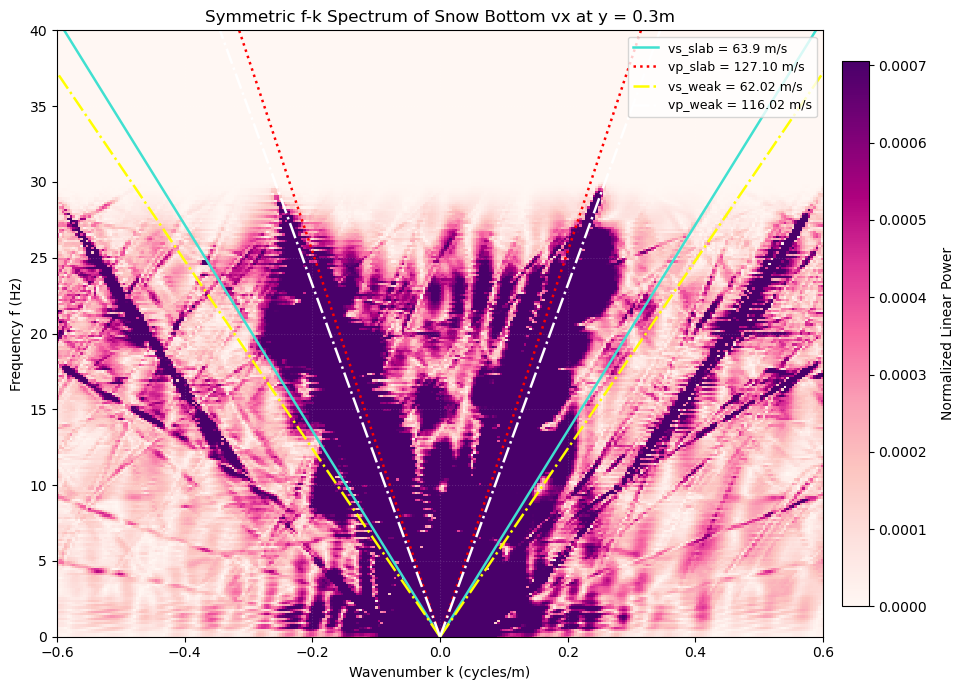

In [53]:
# Snow Surface Receiver Coordinate in 5-Layer Model
y_recv = 0.3 

# Estimated Rupture Speed (m/s)
rupture_speed = 70.0  

def resolve_names(da):
    coords_set = set(da.coords)
    dims_set = set(da.dims)

    x_name = next((n for n in ["x", "X", "p0", "dim_0"] if n in coords_set or n in dims_set), None)
    y_name = next((n for n in ["y", "Y", "p1", "dim_1"] if n in coords_set or n in dims_set), None)
    t_name = next((n for n in ["t", "time"] if n in coords_set or n in dims_set), None)
    c_name = next((n for n in ["c", "component"] if n in coords_set or n in dims_set), None)

    if x_name is None or y_name is None or t_name is None or c_name is None:
        raise ValueError("Could not resolve required dimensions.")

    return x_name, y_name, t_name, c_name

def compute_fk_panel(da, y_surface):
    x_name, y_name, t_name, c_name = resolve_names(da)

    sg = da.sel({y_name: y_surface}, method="nearest").isel({c_name: 0})
    sg = sg.transpose(t_name, x_name)

    t_vals = sg[t_name].values
    x_vals = sg[x_name].values
    data = sg.values

    if data.shape[0] == len(x_vals):
        data = data.T

    nt, nx = data.shape
    dt = float(np.nanmedian(np.diff(t_vals)))
    dx = float(np.nanmedian(np.diff(x_vals)))

    std_per_trace = np.std(data, axis=0, keepdims=True)
    std_per_trace[std_per_trace < 1e-20] = 1.0
    data_normalized = data / std_per_trace

    taper_t = np.hanning(nt)
    taper_x = np.hanning(nx)
    data_tapered = data_normalized * taper_t[:, None] * taper_x[None, :]
    
    # Compute 2D FFT
    fk = np.fft.fftshift(np.fft.fft2(data_tapered))
    freqs = np.fft.fftshift(np.fft.fftfreq(nt, dt))
    wns = np.fft.fftshift(np.fft.fftfreq(nx, dx))

    # Flip wavenumber axis to correct NumPy FFT phase convention
    fk = np.fliplr(fk)

    f_pos_mask = freqs >= 0
    fk_pos = fk[f_pos_mask, :]
    f_plot = freqs[f_pos_mask]

    # Linear magnitude normalized by max
    mag = np.abs(fk_pos)
    pk = mag / np.max(mag) 
    
    vmax_pk = float(np.percentile(pk, 99)) 
    vmin_pk = 0.0

    return {
        "pk": pk,
        "f_plot": f_plot,
        "wns": wns,
        "vmin_pk": vmin_pk,
        "vmax_pk": vmax_pk,
        "k_max": float(np.nanmax(np.abs(wns))),
    }

# Compute 2D f-k spectrum
panel = compute_fk_panel(dis_2d_layered_dt, y_recv)

# Single Plot Setup
fig, ax = plt.subplots(1, 1, figsize=(10, 7))

# Updated Reference Velocities for 5-Layer Model (Slab  and weak layer properties)
reference_velocities = [
    ("vs_slab = 63.9 m/s", 67.94, "turquoise", "-"),
    # (f"rupture speed = {rupture_speed:.1f} m/s", rupture_speed, "blue", "--"),
    ("vp_slab = 127.10 m/s", 127.10, "red", ":"),
    ("vs_weak = 62.02 m/s", 62.02, "yellow", "-."),
    ("vp_weak = 116.02 m/s", 116.02, "white", "-."),
]

WNS, FREQS = np.meshgrid(panel["wns"], panel["f_plot"])

mesh = ax.pcolormesh(
    WNS,
    FREQS,
    panel["pk"],
    shading="nearest",
    cmap="RdPu", 
    vmin=panel["vmin_pk"],
    vmax=panel["vmax_pk"],
)

k_max = panel["k_max"]

for label, speed, col, ls in reference_velocities:
    # Right-propagating dispersion lines
    k_right = panel["f_plot"] / speed
    mask_right = np.abs(k_right) <= k_max
    ax.plot(
        k_right[mask_right],
        panel["f_plot"][mask_right],
        color=col,
        lw=1.8,
        linestyle=ls,
        label=label,
    )

    # Left-propagating dispersion lines
    k_left = -panel["f_plot"] / speed
    mask_left = np.abs(k_left) <= k_max
    ax.plot(
        k_left[mask_left],
        panel["f_plot"][mask_left],
        color=col,
        lw=1.8,
        linestyle=ls,
    )

ax.set_xlim(-0.6, 0.6)
ax.set_ylim(0, 40)
ax.set_xlabel("Wavenumber k (cycles/m)")
ax.set_ylabel("Frequency f (Hz)")
ax.set_title(f"Symmetric f-k Spectrum of Snow Bottom vx at y = {y_recv}m")
ax.grid(True, alpha=0.15, color="white", linestyle=":")
ax.legend(fontsize=9, loc="upper right")

cbar = fig.colorbar(mesh, ax=ax, shrink=0.9, pad=0.02)
cbar.set_label("Normalized Linear Power", labelpad=10)

plt.tight_layout()
display(fig)
plt.close(fig)